In [1]:
from sys import platform
import sys
from matplotlib import pyplot
pyplot.rcParams['figure.dpi'] = 150
pyplot.rcParams['savefig.dpi'] = 150
if platform == "linux" or platform == "linux2" or platform == "darwin":
    sys.path.append("../../")

In [2]:
%matplotlib widget
import time

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import random
from src.v2.impl.conditions import StepCountCondition, PrecisionCondition, AbsolutePrecisionCondition, EpochCountCondition
from src.v2.impl.function_interpretations import LinearInterpretation, PolynomialInterpretation, MultiLinearInterpretation, HyperbolicInterpretation
from src.v2.impl.loss_functions import MSE, LineBinary
from src.v2.impl.methods import CoordinateDescent, GoldenRatioMethod, NewtonWolfe, GradientDescentSheduled, GradientDescentBase
from src.v2.impl.metrics import StepCount, CallCount, GradientCallCount, HessianCallCount, PrecisionCount, \
    AbsolutePrecisionCount, AbsolutePrecision, MinAbsolutePrecision, RAMSize, ExecutionTime, EpochCount, LossValue, ResultValue
from src.v2.impl.oraculs import LambdaOracul, SymbolOracul, MinimisingOracul
from src.v2.runner.debug import FULL_DEBUG
from src.v2.runner.runner import Runner, FULL_VISUALIZE, NO_VISUALIZE, FULL_ANIMATION, VISUALIZE_FUNCTION, VISUALIZE
from src.v2.visualization.animation import Animator
from src.v2.runner.runner import TABLE
from src.v2.impl.methods import GradientDescent, ScipyMethod, Newton, NewtonBase
from IPython.display import display, HTML
from functools import partial
from src.v2.impl.loss_functions import L1, L2, Elastic
from src.v2.impl.function_interpretations import LambdaInterpretation
from math import sin, pi
import matplotlib.pyplot as plt
import numpy as np
from sklearn.datasets import make_classification
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import LinearSVC
from sklearn.decomposition import PCA

with open('iris.data', 'r') as f:
    data = [list(map(lambda x: float(x) if ord('0') <= ord(x[0]) <= ord('9') else x.replace('\n', ''),
                     line.split(','))) for line in f]


display(HTML("<style>pre { white-space: pre !important; }</style>"))


def print_points(data):
    for i in data:
        print(i[0] + i[1])
        
def seed(val: int = -1):
    if val == -1:
        val = time.time_ns()
    random.seed(val)
    print("SEED:", val)

In [3]:
metrics_base = [ExecutionTime(), RAMSize(), EpochCount(), CallCount(), GradientCallCount(), LossValue(), ResultValue(), Animator()]

minPrec = 1e-5
defPrec = 1e-9
maxPrec = 1e-11

animations = [Animator()]

conditions = [StepCountCondition(100)]

modules = metrics_base + conditions
methods = [GradientDescent(learning_rate=100, aprox_dec=1e-5)]
point = np.array([10.2, 32.5, 2.0])

In [4]:
def noised_data_generator(func, num, begin, end, noise_range) :
    res = []
    for i in range(0, num):
        point = random.uniform(begin, end)
        res += [[point, func(point) + random.uniform(-noise_range, noise_range)]]
    return res

In [5]:
linear_data = noised_data_generator(lambda x: 6*x+10, 100, -1000, 1000, 1000)
sq_data = noised_data_generator(lambda x: 6*x**2+10*x+1, 100, -1000, 1000, 1000)

In [6]:
point = np.array([10.2, 32.5, 2.0])
linear_min_oracul = MinimisingOracul(MSE(), LinearInterpretation(), linear_data, 1)
linear_oracul = MinimisingOracul(MSE(), LinearInterpretation(), linear_data, 20)
linear_max_oracul = MinimisingOracul(MSE(), LinearInterpretation(), linear_data, len(linear_data))
polynomial_min_oracul = MinimisingOracul(MSE(), PolynomialInterpretation(), sq_data, 1)
polynomial_oracul = MinimisingOracul(MSE(), PolynomialInterpretation(), sq_data, 20)
polynomial_max_oracul = MinimisingOracul(MSE(), PolynomialInterpretation(), sq_data, len(sq_data))



MinimisingOracul
+--------------------------------------------------+-----------------+-----------+--------------+-------------+---------------------+-------------+------------------------------------------+
| Method name                                      |   ExecutionTime | RAMSize   |   EpochCount |   CallCount |   GradientCallCount |   LossValue | Result                                   |
+==================================================+=================+===========+==============+=============+=====================+=============+==========================================+
| GradientDescent(100,GoldenRatioMethod,eps=1e-05) |        0.155491 | 0.5625 Mb |            0 |        3564 |                  99 | 2.65002e+06 | [  3.16491546 -36.94556881   2.        ] |
+--------------------------------------------------+-----------------+-----------+--------------+-------------+---------------------+-------------+------------------------------------------+

MinimisingOracul
+--------

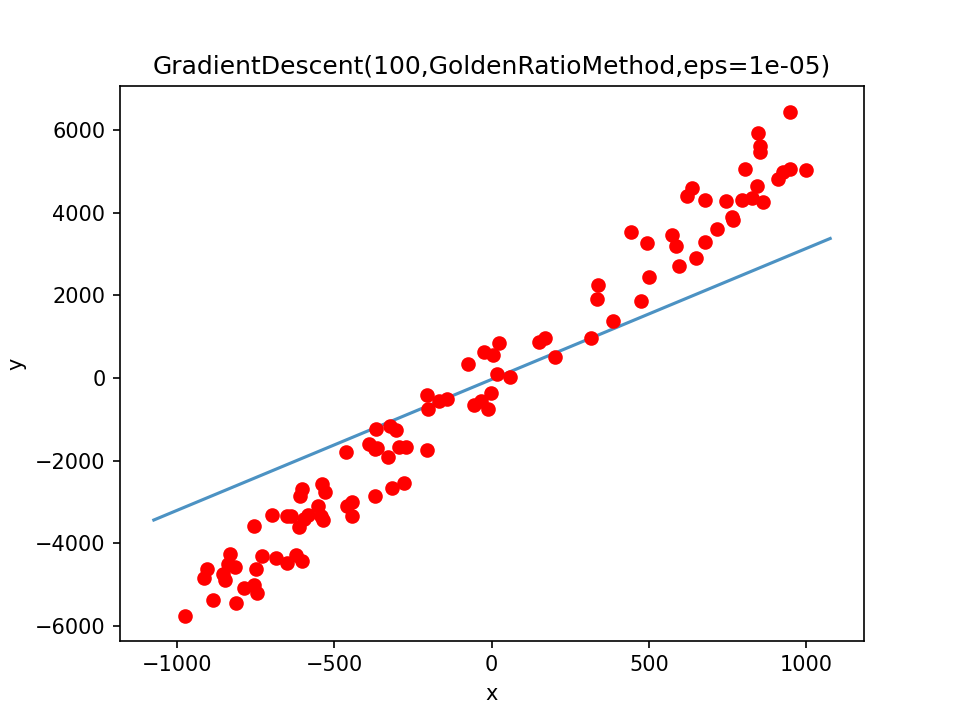

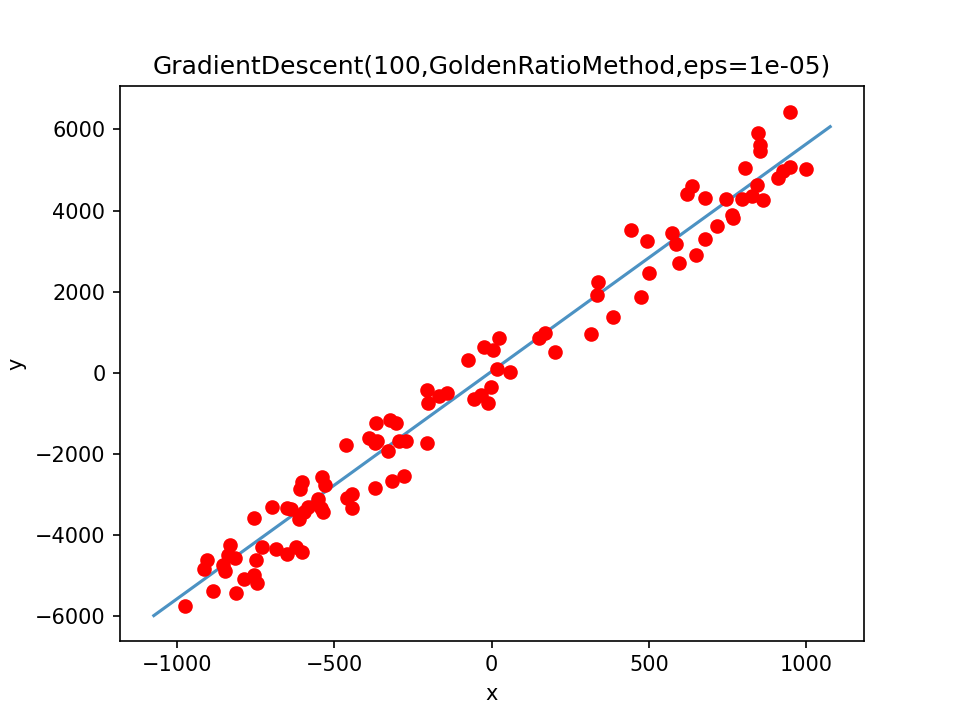

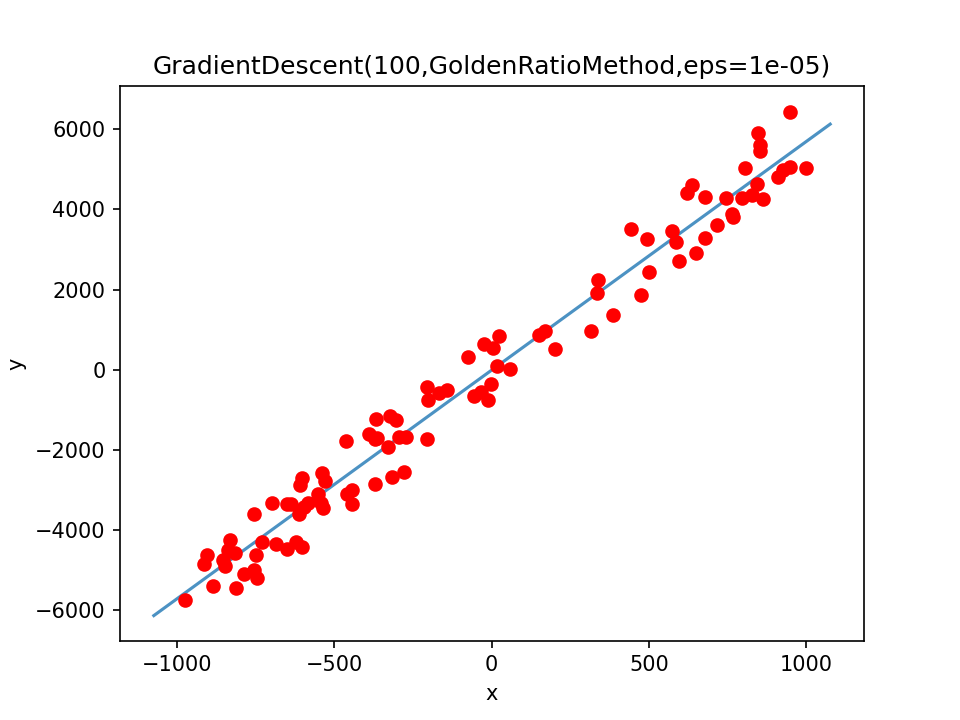

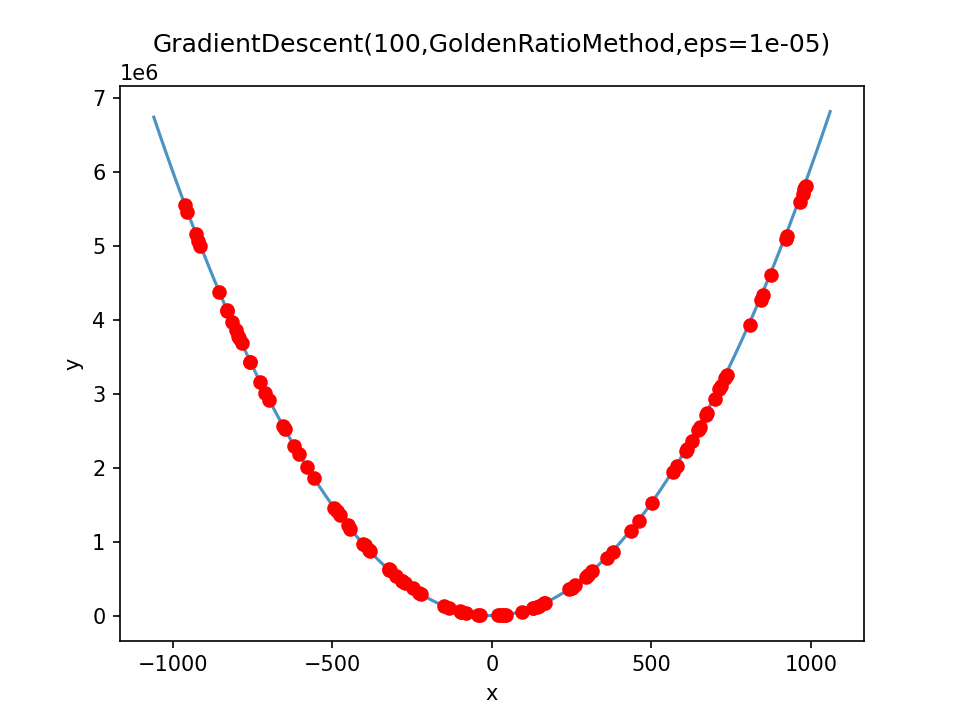

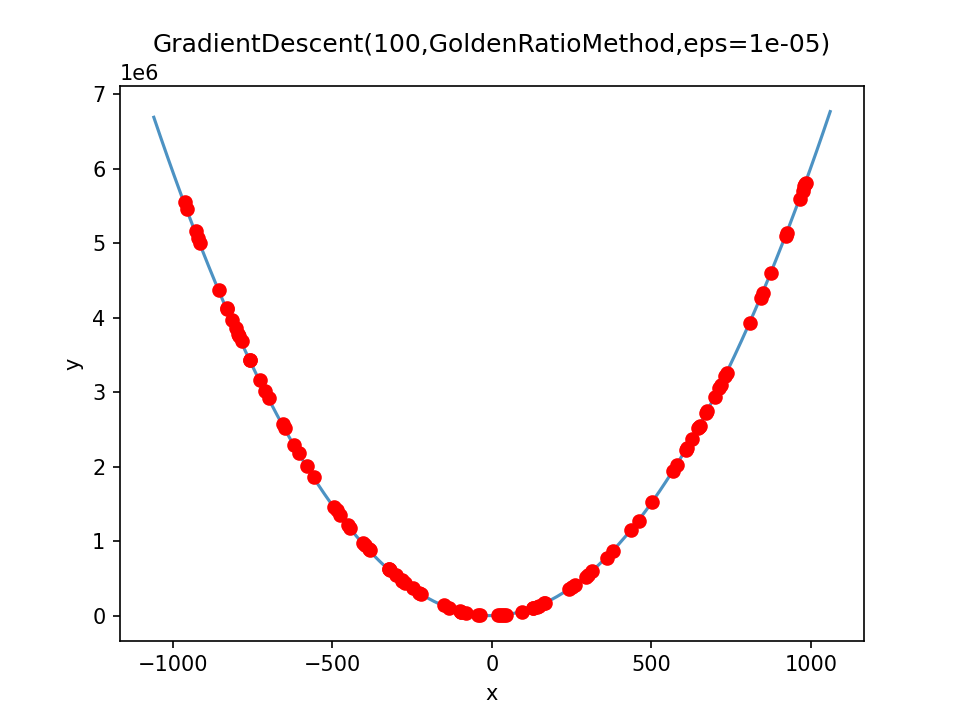

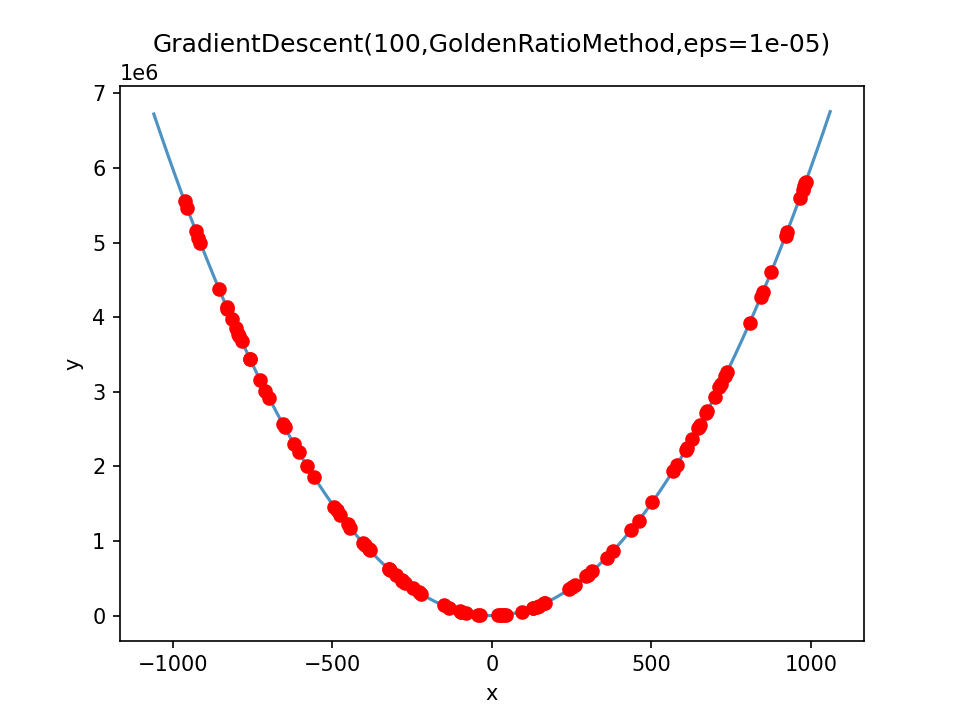

In [7]:
result = Runner.run(methods, [linear_min_oracul, linear_oracul, linear_max_oracul, polynomial_min_oracul, polynomial_oracul, polynomial_max_oracul], point, modules, precision=defPrec,
                 # **FULL_DEBUG,
                 **TABLE,
                 **VISUALIZE,
                 # **FULL_VISUALIZE,
                 # **FULL_ANIMATION,
                 **VISUALIZE_FUNCTION
                 )

In [8]:
import matplotlib.pyplot as plt
def gen_areas(per_class, areas):
    res = []
    counter = 0
    for i in areas:
        for j in range(per_class):
            res += [[random.uniform(i[0], i[1]), random.uniform(i[2], i[3]), counter]]
        counter += 1
    return res
def get_data(temp, dim):
    x = []
    y = []
    for j in temp:
        if j[2] == dim:
            x += [j[0]]
            y += [j[1]]
    return x, y

groups = gen_areas(100, [[-100, 100, -100, 100], [200, 500, 200, 500]])

In [9]:
conditions = [EpochCountCondition(30)]

modules = (  [ExecutionTime()]
           + [RAMSize()]
           + [EpochCount()]
           +  metrics_base
           + conditions
           + [Animator()]
           )
primal_classes_oracul_min = MinimisingOracul(LineBinary(), LinearInterpretation(), groups, 1)
primal_classes_oracul = MinimisingOracul(LineBinary(), LinearInterpretation(), groups, 25)
primal_classes_oracul_max = MinimisingOracul(LineBinary(), LinearInterpretation(), groups, len(groups))
result_gr = Runner.run([GradientDescent(learning_rate=200, aprox_dec=1e-5)], [primal_classes_oracul_min, primal_classes_oracul, primal_classes_oracul_max], np.array([0, 30]), modules, precision=defPrec,
                    # **FULL_DEBUG,
                    **TABLE,
                    #**VISUALIZE,
                    # **FULL_VISUALIZE,
                    # **FULL_ANIMATION,
                    #**VISUALIZE_FUNCTION
                    )


MinimisingOracul
+--------------------------------------------------+-----------------+-------------+--------------+-----------------+-------------+--------------+-------------+---------------------+-------------+-----------------------------------+
| Method name                                      |   ExecutionTime | RAMSize     |   EpochCount |   ExecutionTime | RAMSize     |   EpochCount |   CallCount |   GradientCallCount |   LossValue | Result                            |
+==================================================+=================+=============+==============+=================+=============+==============+=============+=====================+=============+===================================+
| GradientDescent(200,GoldenRatioMethod,eps=1e-05) |         6.64523 | 0.265625 Mb |           30 |         6.92719 | 0.046875 Mb |           30 |      222000 |                6000 |       2e-08 | [-2.93855709e-02  2.04023185e+02] |
+-------------------------------------------------

In [10]:
def get_line_p(data):
    interpreter = LinearInterpretation()
    return [interpreter.interpret(data, np.array([10])), interpreter.interpret(data, np.array([-30]))]
def visualize(data, res):
    line = get_line_p(res)
    x, y = get_data(data, 0)
    axes = plt.figure().add_subplot()
    plt.axline([line[0][0], line[0][1]], [line[1][0], line[1][1]])
    axes.scatter(x, y, c ="green")
    x, y = get_data(data, 1)
    axes.scatter(x, y, c = "yellow") 
    plt.show()

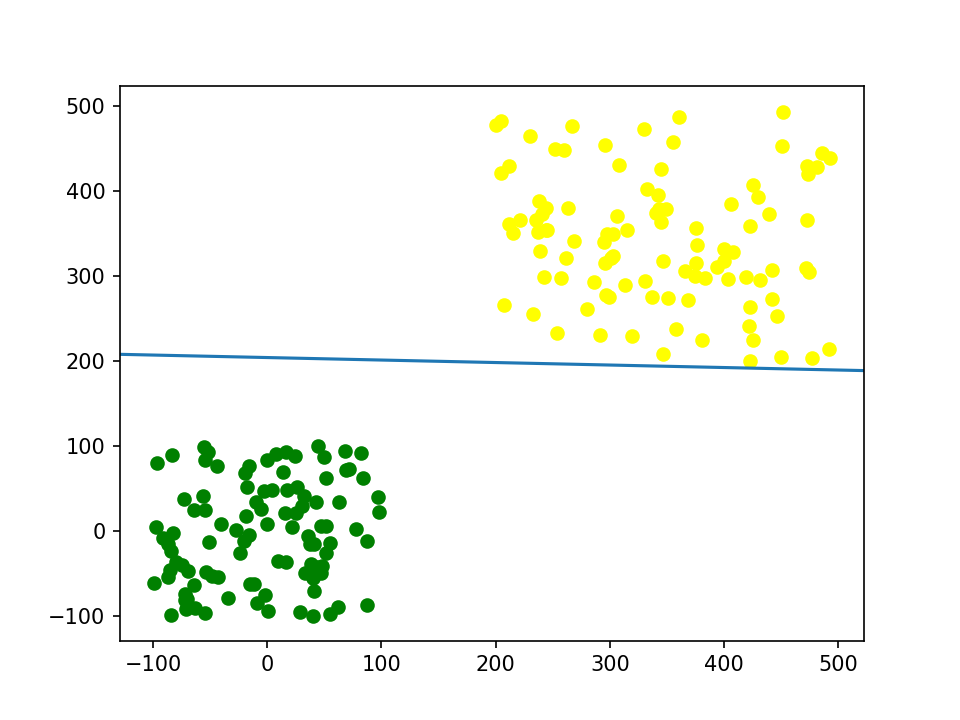

In [11]:
visualize(groups, result_gr[0][0][0][1])

In [12]:
import pandas as pd
url = 'http://archive.ics.uci.edu/ml/machine-learning-databases/auto-mpg/auto-mpg.data'
column_names = ['MPG', 'Cylinders', 'Displacement', 'Horsepower', 'Weight',
                'Acceleration', 'Model Year', 'Origin']

raw_dataset = pd.read_csv(url, names=column_names,
                          na_values='?', comment='\t',
                          sep=' ', skipinitialspace=True)
dataset = raw_dataset.copy()
dataset = dataset[['Cylinders', 'Displacement', 'Horsepower', 'Weight',
                'Acceleration', 'Model Year', 'Origin', 'MPG']]
dataset = dataset.dropna()
data_normal=(dataset-dataset.mean())/dataset.std()
data_normal.tail()

,Cylinders,Displacement,Horsepower,Weight,Acceleration,Model Year,Origin,MPG
393,-0.862911,-0.519972,-0.479835,-0.220842,0.021267,1.634321,-0.715726,0.455359
394,-0.862911,-0.930889,-1.363154,-0.997859,3.283479,1.634321,0.525711,2.633448
395,-0.862911,-0.567753,-0.531795,-0.803605,-1.428605,1.634321,-0.715726,1.095974
396,-0.862911,-0.711097,-0.661694,-0.415097,1.108671,1.634321,-0.715726,0.583482
397,-0.862911,-0.720653,-0.583754,-0.303253,1.398646,1.634321,-0.715726,0.967851


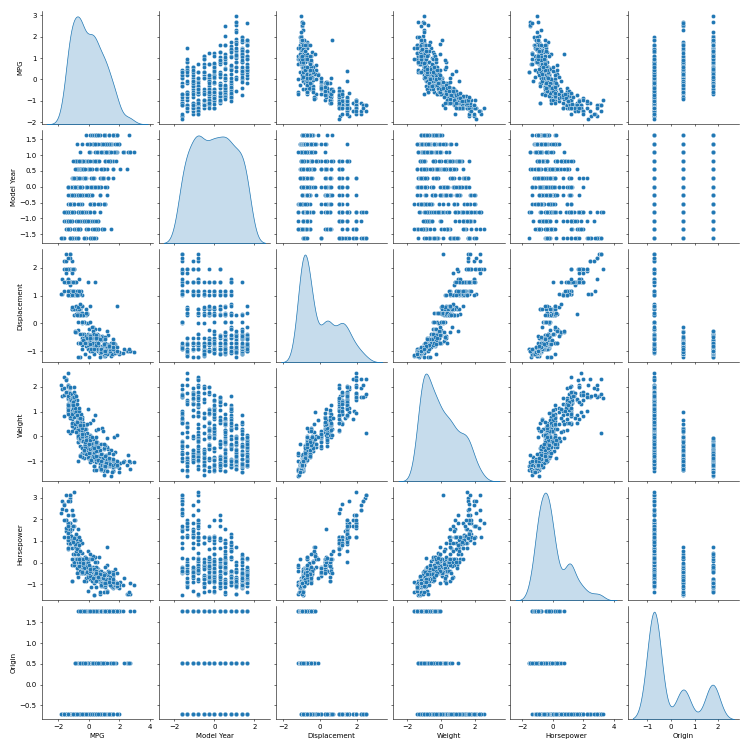

In [13]:
pyplot.rcParams['figure.dpi'] = 50
pyplot.rcParams['savefig.dpi'] = 50
sns.pairplot(data_normal[['MPG', 'Model Year', 'Displacement', 'Weight', 'Horsepower', 'Origin']], diag_kind='kde')

In [14]:
pyplot.rcParams['figure.dpi'] = 150
pyplot.rcParams['savefig.dpi'] = 150
data_normal_np = data_normal.to_numpy()
mpg_regress = MinimisingOracul(MSE(), MultiLinearInterpretation(7), data_normal_np, 30)
result = Runner.run([GradientDescent(learning_rate=100, aprox_dec=1e-5)], [mpg_regress], np.array([1, 1, 1, 1, 1, 1, 1, 1]), modules, precision=defPrec,
                    # **FULL_DEBUG,
                    **TABLE,
                    #**VISUALIZE,
                    # **FULL_VISUALIZE,
                    # **FULL_ANIMATION,
                    #**VISUALIZE_FUNCTION
                    )


MinimisingOracul
+--------------------------------------------------+-----------------+-------------+--------------+-----------------+-------------+--------------+-------------+---------------------+-------------+--------------------------------------------------------------------------+
| Method name                                      |   ExecutionTime | RAMSize     |   EpochCount |   ExecutionTime | RAMSize     |   EpochCount |   CallCount |   GradientCallCount |   LossValue | Result                                                                   |
+==================================================+=================+=============+==============+=================+=============+==============+=============+=====================+=============+==========================================================================+
| GradientDescent(100,GoldenRatioMethod,eps=1e-05) |         38.2255 | 1.015625 Mb |           30 |         38.5085 | 0.546875 Mb |           30 |       15120 |      

/Users/mike/Documents/Methods-of-optimization/venv/lib/python3.9/site-packages/matplotlib/animation.py:892: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


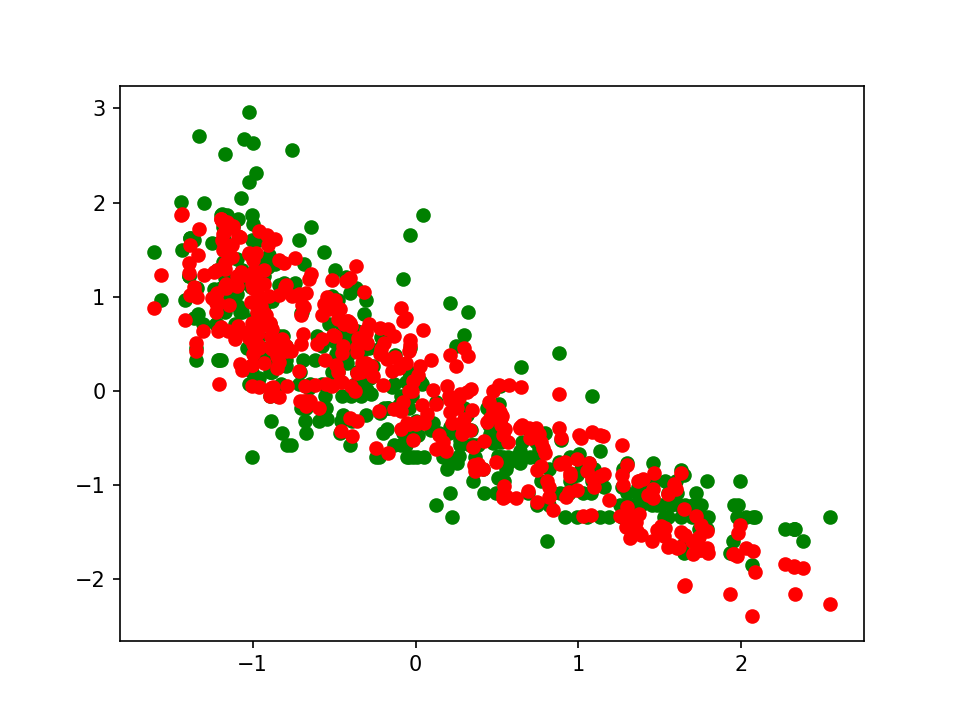

In [15]:
def get_prediction(res, point, ind):
    return point[ind], MultiLinearInterpretation(7).interpret(res, point)[-1]
def print_some(name, res, ind):
    x = data_normal[name]
    y = data_normal['MPG']
    axes = plt.figure().add_subplot()
    points_x = []
    points_y = []
    for i in data_normal_np:
        t_x, t_y = get_prediction(res, i[0:7], ind)
        points_x += [t_x]
        points_y += [t_y]
    axes.scatter(x, y, c ="green")
    axes.scatter(points_x, points_y, c ="red")
    plt.show()
    plt.close()
print_some('Weight', result[0][0][0][1], 3)

In [16]:
result[0][0][0][1]

array([-0.13591845,  0.28798101, -0.10037378, -0.70861886, -0.02125615,
        0.38718812,  0.22301899,  0.02124031])

In [17]:
def epoch_sheduler(base_rate, state, decay):
    return base_rate * (1 /(1 + decay * state.epoch))
def step_sheduler(base_rate, state, decay, steps):
    return base_rate * (1 /(1 + decay * ((state.epoch * steps) + state.step)))
def ladder_sheduler(base_rate, state):
    if (state.epoch >= 10):
        return base_rate / 10
    if (state.epoch >= 20):
        return base_rate / 100
    return base_rate


MinimisingOracul
+----------------------------------------+-----------------+-------------+--------------+-------------+---------------------+-------------+-----------------------------------------------+
| Method name                            |   ExecutionTime | RAMSize     |   EpochCount |   CallCount |   GradientCallCount |   LossValue | Result                                        |
+========================================+=================+=============+==============+=============+=====================+=============+===============================================+
| GradientDescentBase(1, eps=0.0001)     |         3.90727 | 0.0 Mb      |           30 |           0 |                 150 | 1.70654e+11 | [3.00000032 0.9990249  0.99999789 1.00000001] |
+----------------------------------------+-----------------+-------------+--------------+-------------+---------------------+-------------+-----------------------------------------------+
| GradientDescentScheduled(1,eps=0.0001) |

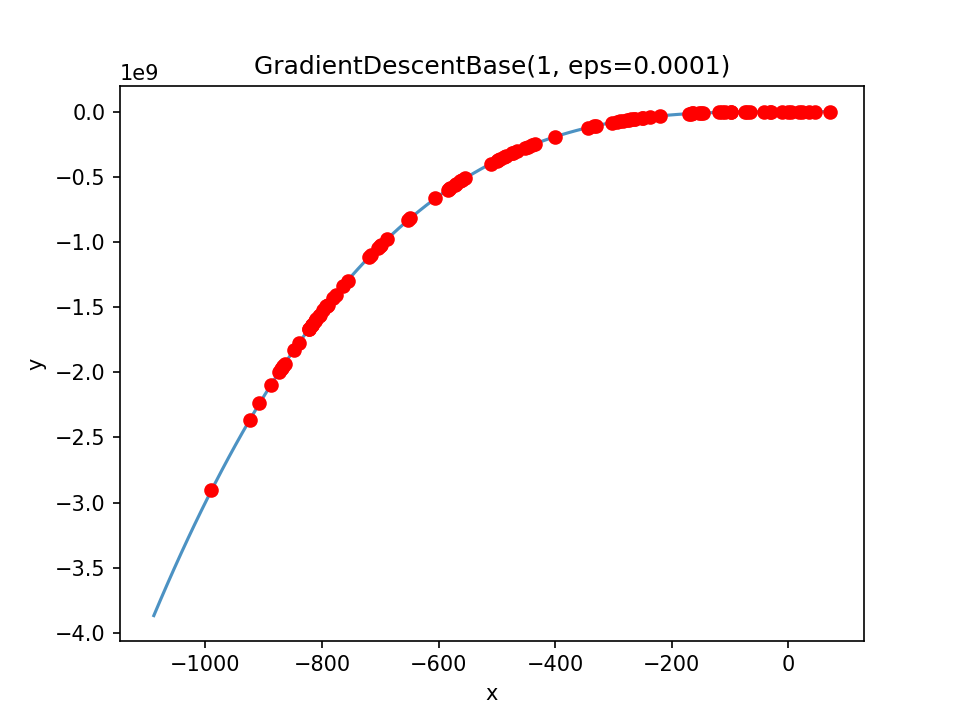

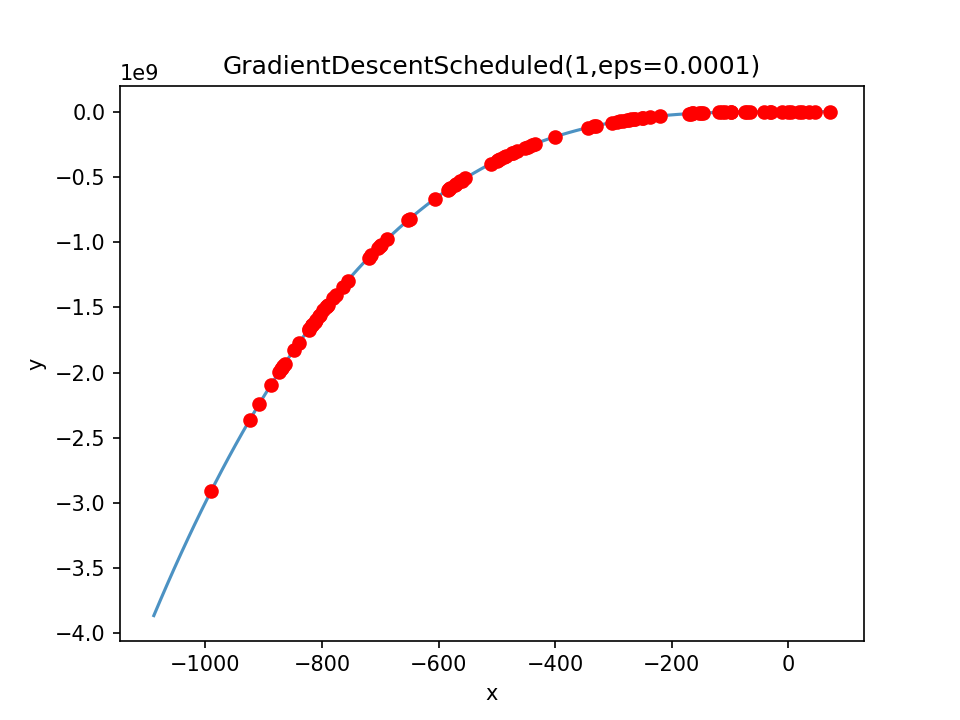

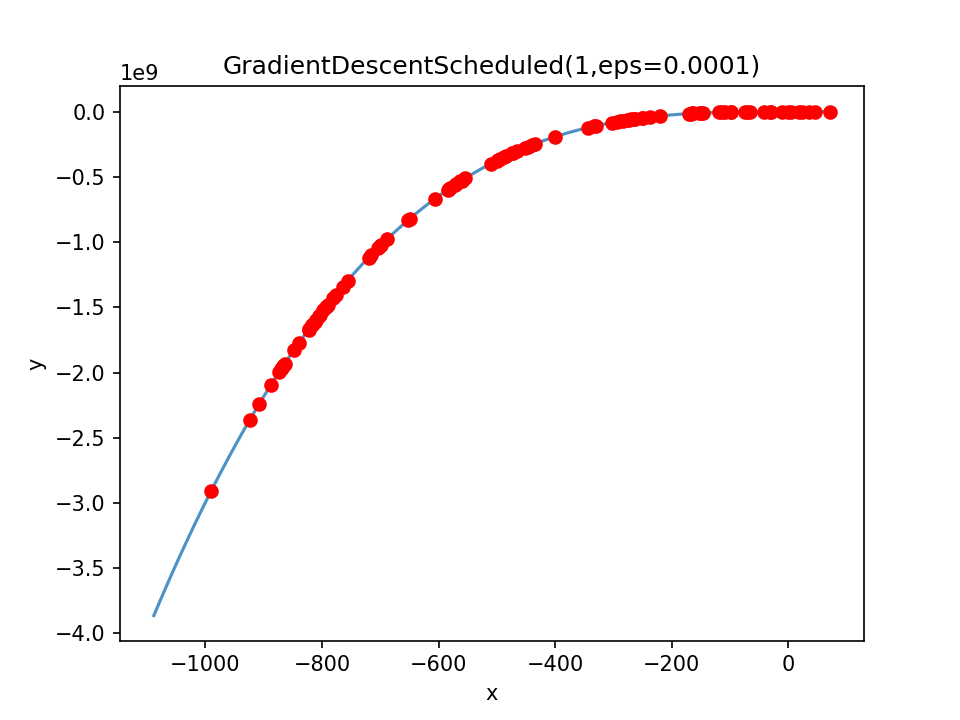

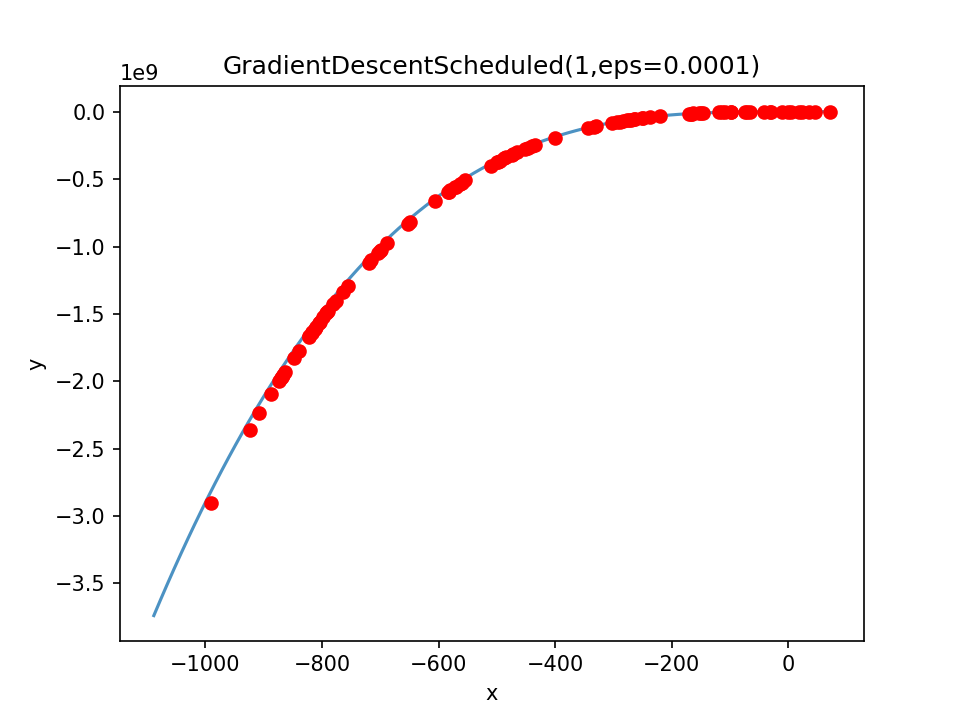

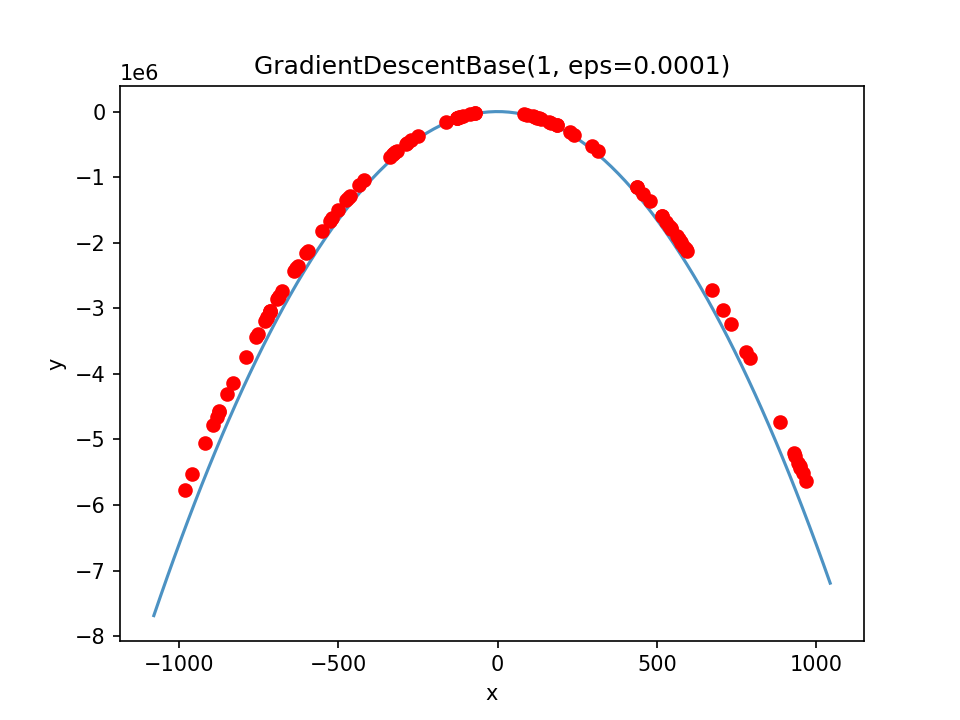

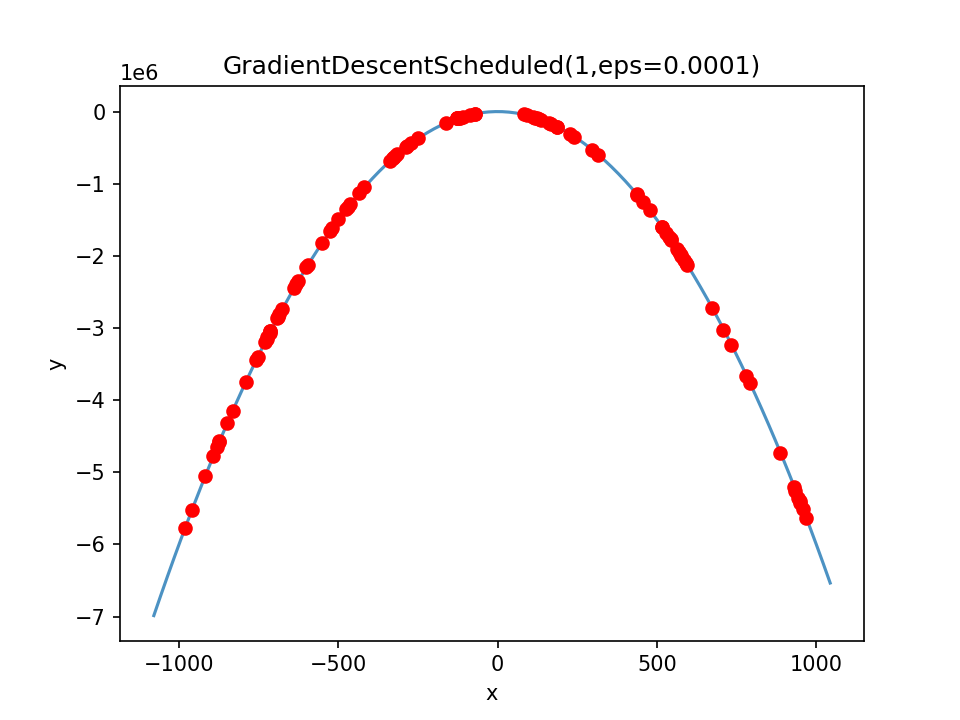

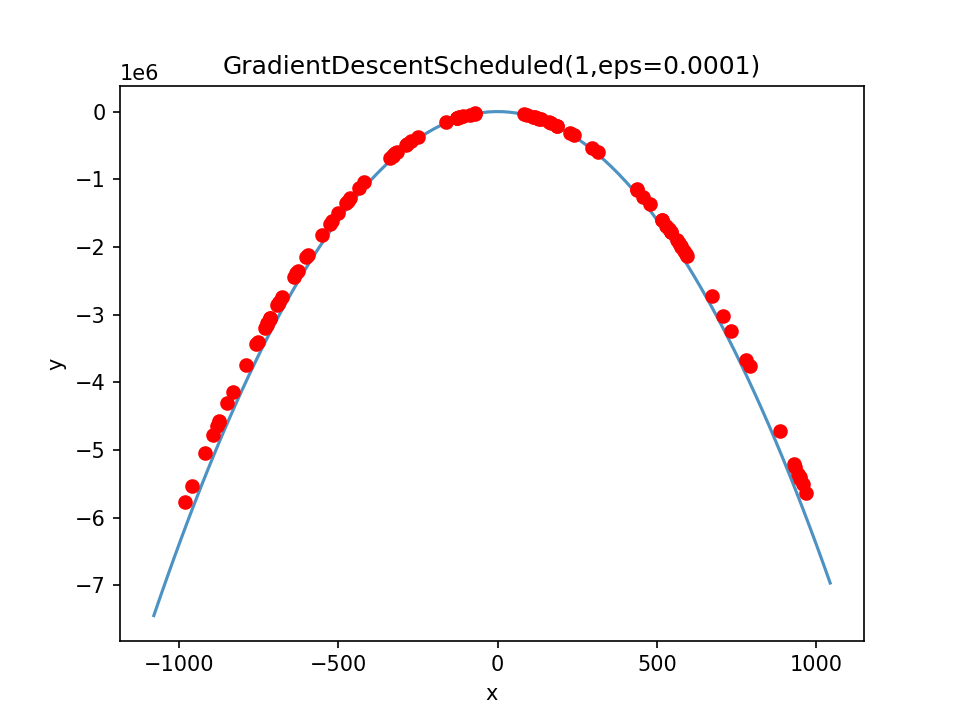

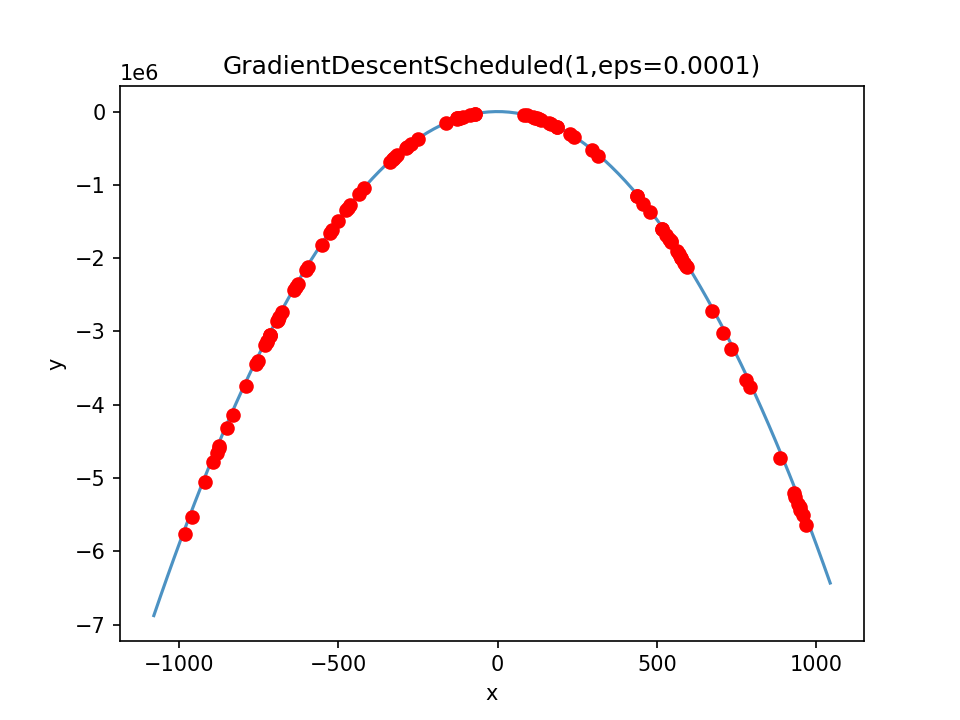

In [18]:
modules = metrics_base + conditions
sheduled = [GradientDescentBase(),
           GradientDescentSheduled(lambda a, b: epoch_sheduler(a, b, 0.5), 1),
           GradientDescentSheduled(lambda a, b: step_sheduler(a, b, 0.01, 5), 1),
           GradientDescentSheduled(lambda a, b: ladder_sheduler(a, b), 1)]
hyperbolic_data = noised_data_generator(lambda x: 3*x**3+2*x**2+10, 100, -1000, 100, 1500)
sq_data1 = noised_data_generator(lambda x: -6*x**2-10*x+1, 100, -1000, 1000, 100)
polynomial_oracul_1 = MinimisingOracul(MSE(), PolynomialInterpretation(), sq_data1, 20)
hyperbolic_oracul = MinimisingOracul(MSE(), HyperbolicInterpretation(), hyperbolic_data, 20)
result = Runner.run(sheduled, [hyperbolic_oracul, polynomial_oracul_1], np.array([1, 1, 1, 1]), modules, precision=defPrec,
                 # **FULL_DEBUG,
                 **TABLE,
                 **VISUALIZE,
                 # **FULL_VISUALIZE,
                 # **FULL_ANIMATION,
                 **VISUALIZE_FUNCTION
                 )

In [19]:
result = Runner.run(sheduled, [mpg_regress], np.array([1, 1, 1, 1, 1, 1, 1, 1]), modules, precision=defPrec,
                 # **FULL_DEBUG,
                 **TABLE,
                 **VISUALIZE,
                 # **FULL_VISUALIZE,
                 # **FULL_ANIMATION,
                 **VISUALIZE_FUNCTION
                 )


MinimisingOracul
+----------------------------------------+-----------------+-------------+--------------+-------------+---------------------+-------------+--------------------------------------------------------------------------+
| Method name                            |   ExecutionTime | RAMSize     |   EpochCount |   CallCount |   GradientCallCount |   LossValue | Result                                                                   |
+========================================+=================+=============+==============+=============+=====================+=============+==========================================================================+
| GradientDescentBase(1, eps=0.0001)     |         35.4014 | 0.40625 Mb  |           30 |           0 |                 420 |    1.47142  | [-0.35319757 -0.19145509 -0.31170553 -0.81689827  0.13030371  0.3833225  |
|                                        |                 |             |              |             |                   

/Users/mike/Documents/Methods-of-optimization/venv/lib/python3.9/site-packages/matplotlib/animation.py:892: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


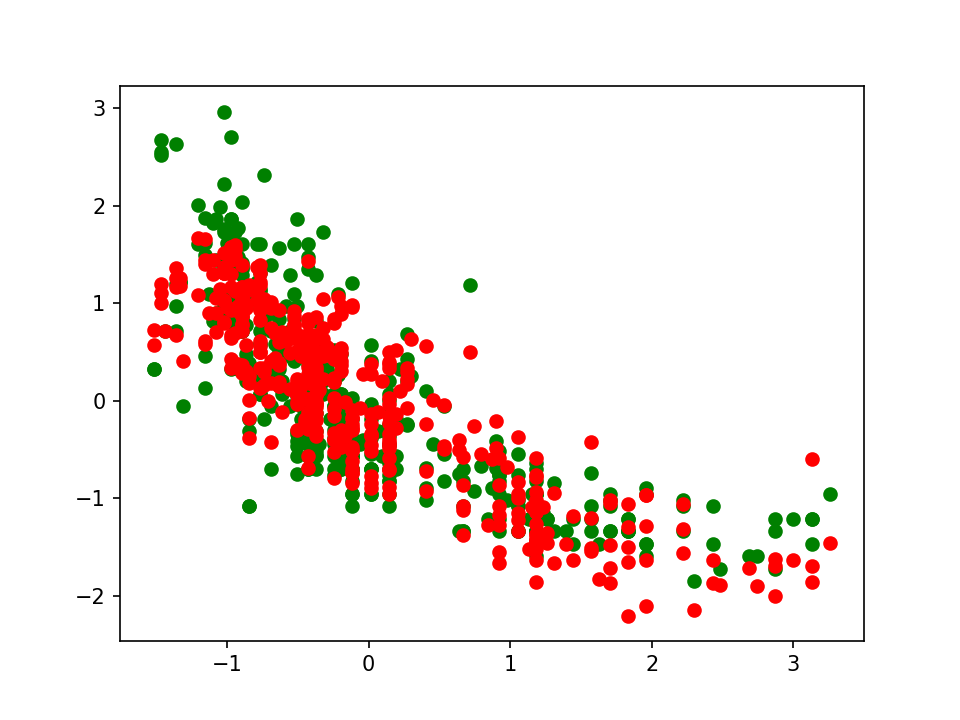

In [20]:
print_some('Horsepower', result[0][1][0][1], 2)

In [21]:
temp1 = np.array(linear_data).transpose()[0:1].transpose()
temp2 = np.array(linear_data).transpose()[1]
data_normal_np_x = data_normal_np.transpose()[0:7].transpose()
data_normal_np_y = data_normal_np.transpose()[7]

In [22]:
import tensorflow as tf
def fit_model(model, optimizer, x, y, epoch, batch_size):
    s_t = time.time()
    #model.load_weights('default.weights.h5')
    model.compile(optimizer=optimizer, loss='mean_absolute_error')
    history = model.fit(x, y, epochs=epoch, batch_size=batch_size, callbacks=[tf.keras.callbacks.ModelCheckpoint(optimizer + "_best.keras")], verbose=0, validation_split = 0.2)
    model.load_weights(optimizer + "_best.keras")
    print("Training time: ", time.time() - s_t)
    print("Best params: ", model.layers[0].get_weights())
    return history

/Users/mike/Documents/Methods-of-optimization/venv/lib/python3.9/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


In [23]:
linear_model_sgd = tf.keras.Sequential([
        tf.keras.layers.Input((7,)),
        tf.keras.layers.Dense(units=1, use_bias=True)
    ])
hist_sgd = fit_model(linear_model_sgd, 'sgd', data_normal_np_x, data_normal_np_y, 50, 20)

Training time:  0.9198317527770996
Best params:  [array([[ 0.13715295],
       [-0.7347738 ],
       [-0.00962602],
       [-0.16591166],
       [-0.15858209],
       [ 0.20010483],
       [ 0.01738897]], dtype=float32), array([-0.13969232], dtype=float32)]


In [24]:
linear_model_adam = tf.keras.Sequential([
        tf.keras.layers.Input((7,)),
        tf.keras.layers.Dense(units=1, use_bias=True)
    ])
hist_adam = fit_model(linear_model_adam, 'adam', data_normal_np_x, data_normal_np_y, 50, 20)

Training time:  0.9755539894104004
Best params:  [array([[-0.24720941],
       [-0.9042813 ],
       [ 0.34659415],
       [ 0.34559196],
       [ 0.09193406],
       [ 0.21261148],
       [ 0.22728151]], dtype=float32), array([-0.07662364], dtype=float32)]


In [25]:
linear_model_rmsprop = tf.keras.Sequential([
        tf.keras.layers.Input((7,)),
        tf.keras.layers.Dense(units=1, use_bias=True)
    ])
hist_rmsprop = fit_model(linear_model_rmsprop, 'rmsprop', data_normal_np_x, data_normal_np_y, 50, 20)

Training time:  0.9260287284851074
Best params:  [array([[-0.27844918],
       [-0.3630821 ],
       [-0.13994424],
       [-0.08360541],
       [-0.25393432],
       [ 0.11032029],
       [-0.11952461]], dtype=float32), array([-0.20854007], dtype=float32)]


In [26]:
linear_model_adagrad = tf.keras.Sequential([
        tf.keras.layers.Input((7,)),
        tf.keras.layers.Dense(units=1, use_bias=True)
    ])
hist_adagrad = fit_model(linear_model_adagrad, 'adagrad', data_normal_np_x, data_normal_np_y, 50, 20)

Training time:  0.9191441535949707
Best params:  [array([[ 0.2980819 ],
       [-0.7669979 ],
       [-0.3764228 ],
       [ 0.536757  ],
       [-0.22127281],
       [-0.05940871],
       [-0.6930574 ]], dtype=float32), array([-0.04505937], dtype=float32)]


In [27]:
def plot_loss(history):
  axes = plt.figure().add_subplot()
  axes.plot(history.history['loss'], label='loss')
  axes.plot(history.history['val_loss'], label='val_loss')
  plt.xlabel('Epoch')
  plt.ylabel('Error [MPG]')
  axes.legend()
  axes.grid(True)
  plt.show()

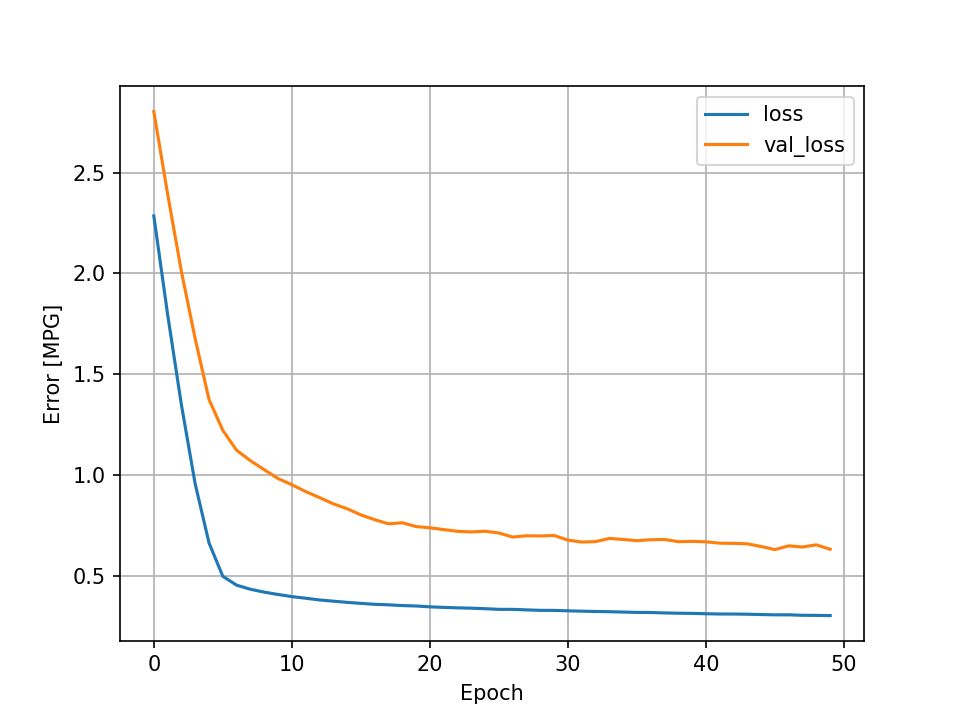

In [28]:
plot_loss(hist_sgd)

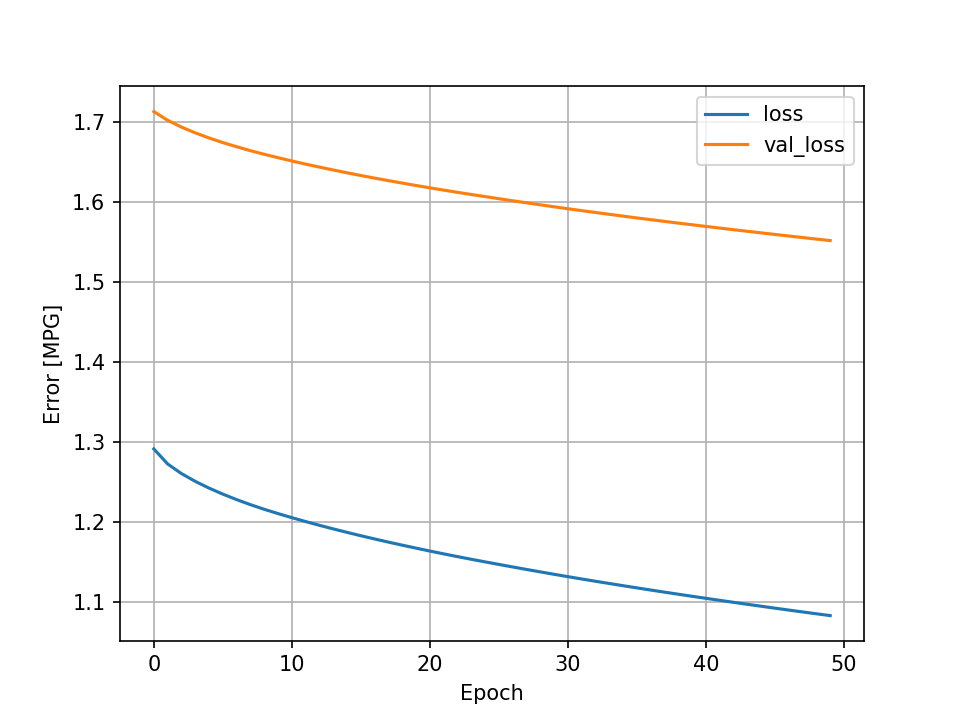

In [29]:
plot_loss(hist_adagrad)

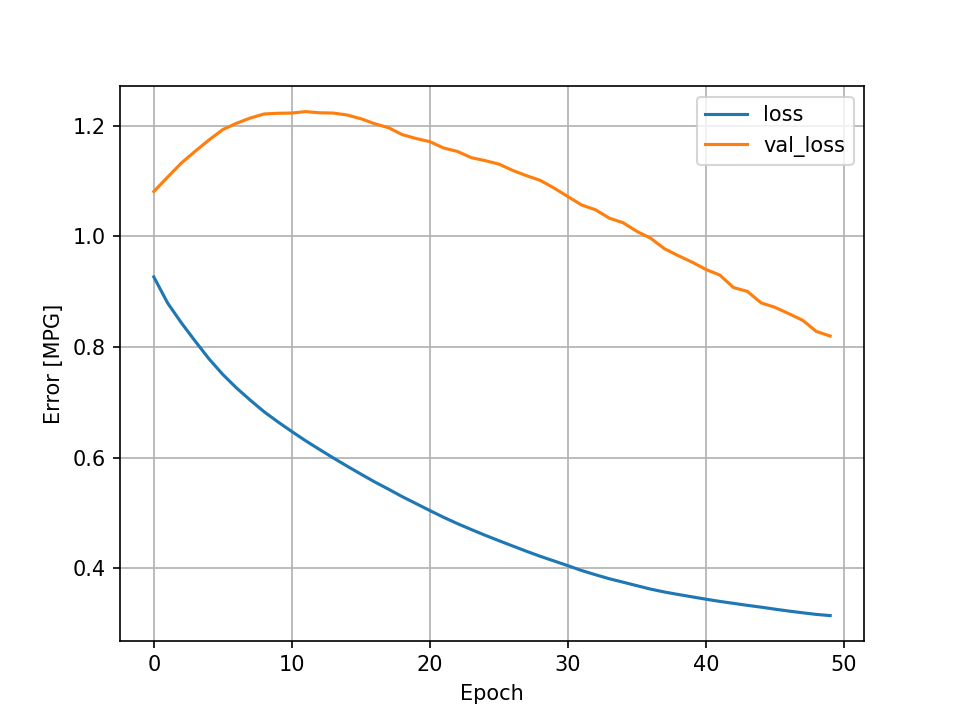

In [30]:
plot_loss(hist_rmsprop)

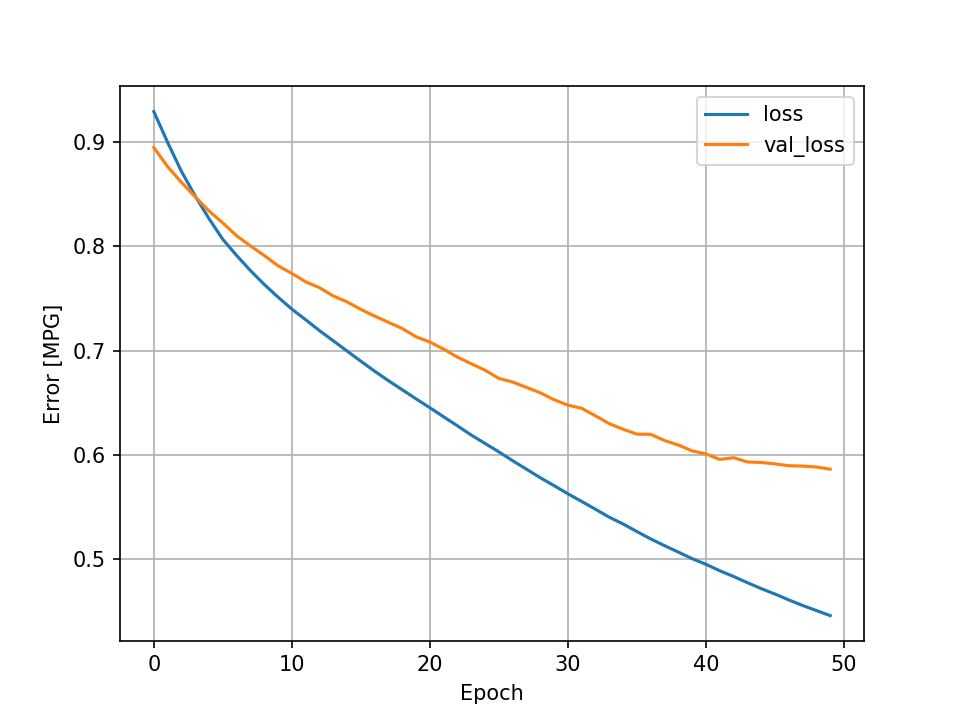

In [31]:
plot_loss(hist_adam)

In [32]:
def polynomSum(a0:float, a1: float, a2: float, a3: float, a4: float, a5: float, point: np.ndarray) -> np.ndarray:
    x = point[0] / 10
    x5 = a5 * x ** 5  
    x4 = a4 * x ** 4
    x3 = a3 * x ** 3
    x2 = a2 * x ** 2
    x1 = a1 * x 
    x0 = a0
    return np.array([x, x5 + x4 + x3 + x2 + x1 + x0])

In [33]:
coefficients = [3, 10, 5, -9, -1, 0.9]
polynom = partial(polynomSum, *coefficients)

point_count = 300
noise = 1
range_ = 30

def noised_data_generator(func, num, begin, end, noise_range):
    res = []
    for i in range(0, num):
        point = random.uniform(begin, end)
        res += [[point, func([point])[-1] + random.uniform(-noise_range, noise_range)]]
    return res

seed()
data =  noised_data_generator(polynom, point_count, -range_, range_, noise)

SEED: 1718011579378471000


In [34]:
conditions = [EpochCountCondition(30)]
modules = metrics_base + conditions
methods = [GradientDescent(learning_rate=1000, aprox_dec=1e-7)]
oraculs = [    
    MinimisingOracul(MSE(), LambdaInterpretation(func = polynomSum, eval_dim = 2), data, point_count // 100),
    MinimisingOracul(MSE(), LambdaInterpretation(func = polynomSum, eval_dim = 2), data, point_count // 10 ),
    MinimisingOracul(MSE(), LambdaInterpretation(func = polynomSum, eval_dim = 2), data, point_count // 1)
]

point = np.array([0, 5, -5, 5, -5, 5])

/Users/mike/Documents/Methods-of-optimization/presentation/lab-3/../../src/v2/visualization/animation.py:154: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  figure_main = plt.figure()



MinimisingOracul
+---------------------------------------------------+-----------------+-------------+--------------+-------------+---------------------+-------------+---------------------------------------------------------------------------+
| Method name                                       |   ExecutionTime | RAMSize     |   EpochCount |   CallCount |   GradientCallCount |   LossValue | Result                                                                    |
+===================================================+=================+=============+==============+=============+=====================+=============+===========================================================================+
| GradientDescent(1000,GoldenRatioMethod,eps=1e-07) |         20.9104 | 0.203125 Mb |           30 |      150000 |                3000 |     260.322 | [ 3.1683294  10.03457236  5.20199618 -9.07451324 -0.96530718  0.94019842] |
+---------------------------------------------------+-----------------+---

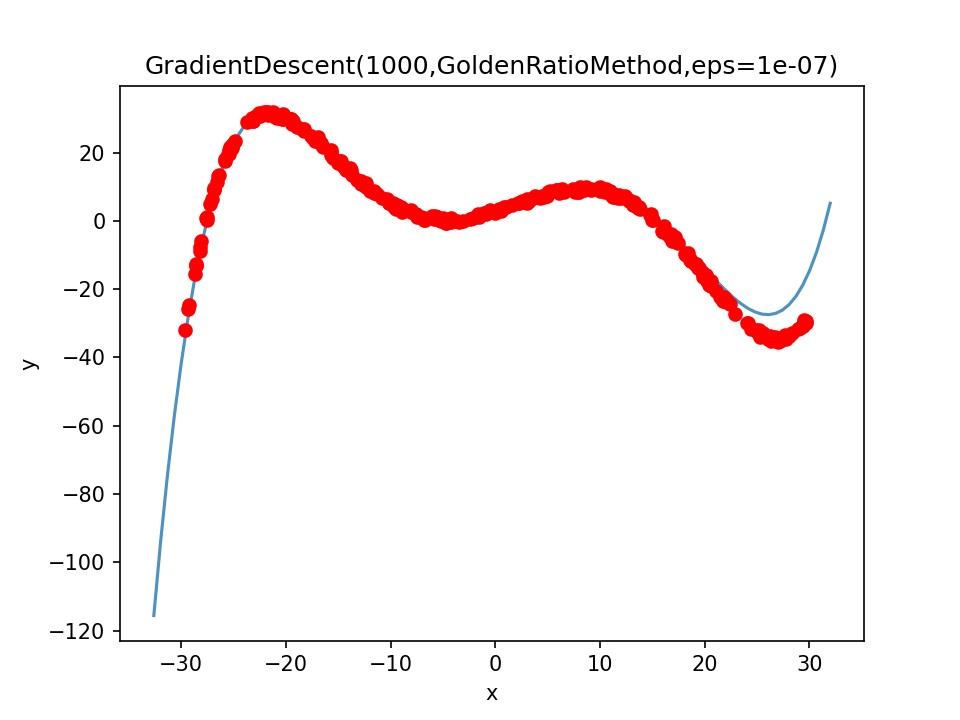

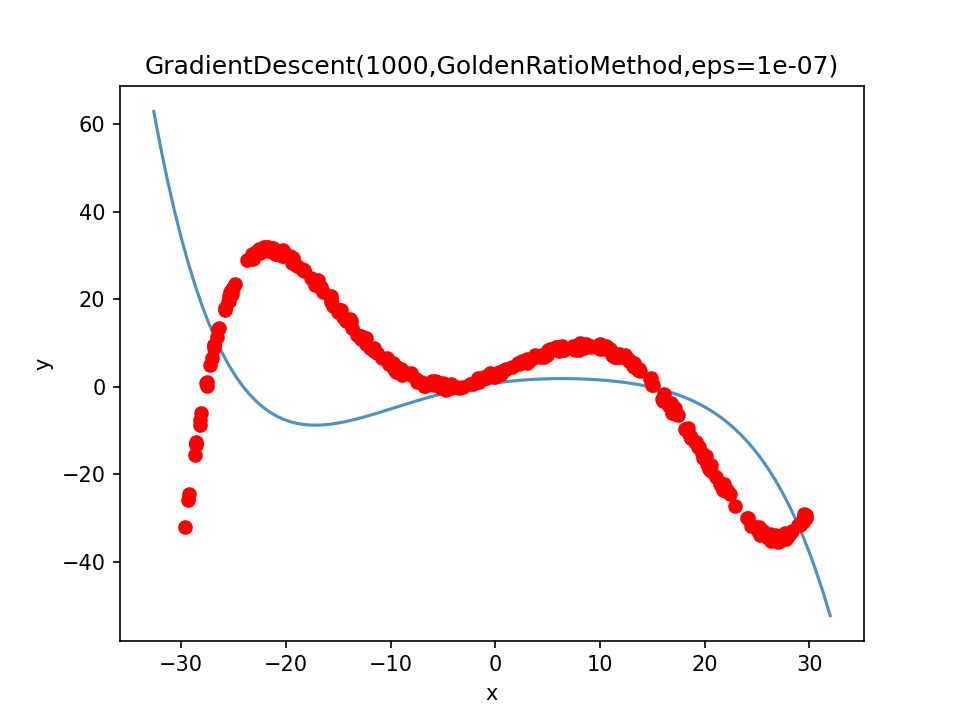

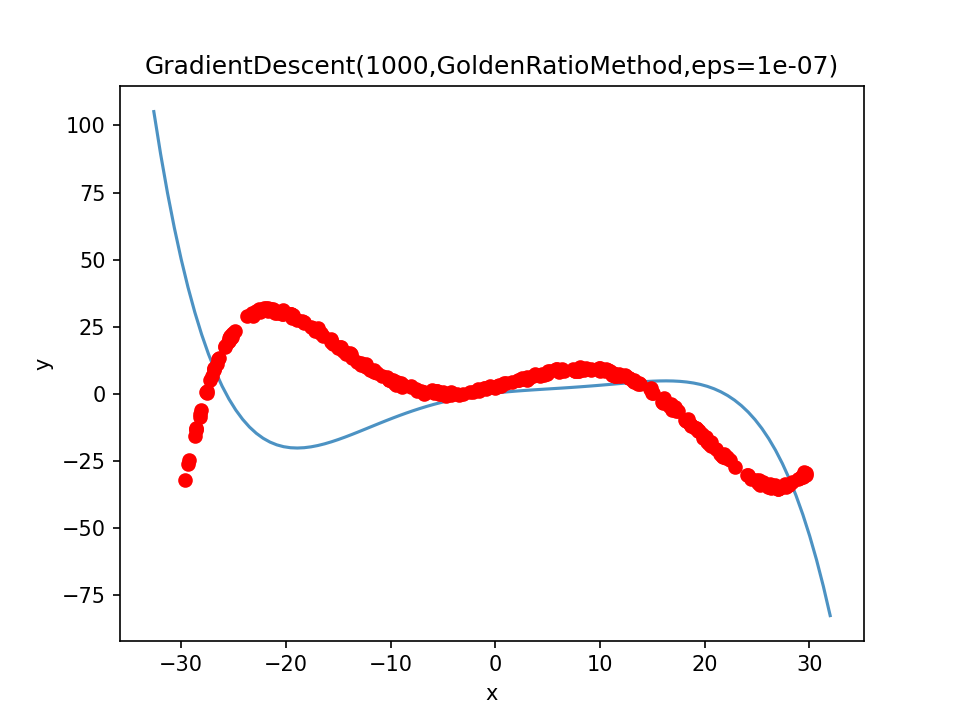

In [35]:
result = Runner.run(methods, oraculs, point,  modules, precision=defPrec, **TABLE, **VISUALIZE, **VISUALIZE_FUNCTION)

In [36]:
oraculs = [    
    MinimisingOracul(L1(MSE(), 0.01), LambdaInterpretation(func = polynomSum, eval_dim = 2), data, point_count // 10),
    MinimisingOracul(L2(MSE(), 500), LambdaInterpretation(func = polynomSum, eval_dim = 2), data, point_count // 10),
    MinimisingOracul(Elastic(MSE(), 0.005, 0.001), LambdaInterpretation(func = polynomSum, eval_dim = 2), data, point_count // 10),
]

SEED: 1718011640267281000



MinimisingOracul
+---------------------------------------------------+-----------------+-----------+--------------+-------------+---------------------+-------------+---------------------------------------------------------------------------+
| Method name                                       |   ExecutionTime | RAMSize   |   EpochCount |   CallCount |   GradientCallCount |   LossValue | Result                                                                    |
+===================================================+=================+===========+==============+=============+=====================+=============+===========================================================================+
| GradientDescent(1000,GoldenRatioMethod,eps=1e-07) |         22.3306 | 0.0 Mb    |           30 |       15000 |                 300 |     565.078 | [ 0.91534313  3.16058311 -2.84862536 -0.22944086  0.28875538 -0.20570591] |
+---------------------------------------------------+-----------------+-----------

/Users/mike/Documents/Methods-of-optimization/venv/lib/python3.9/site-packages/matplotlib/animation.py:892: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


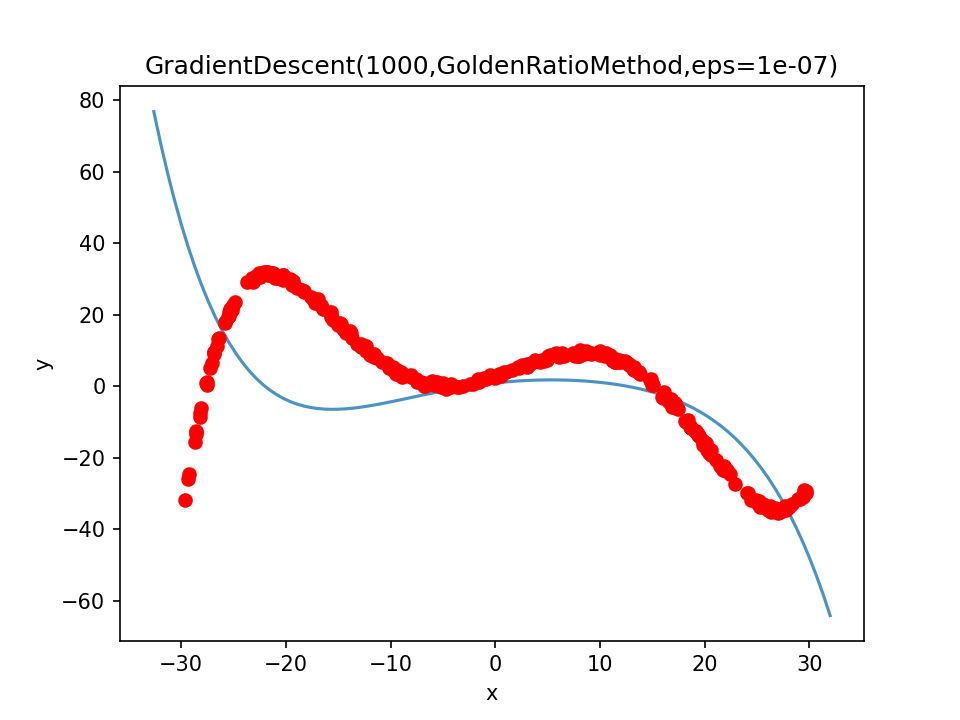

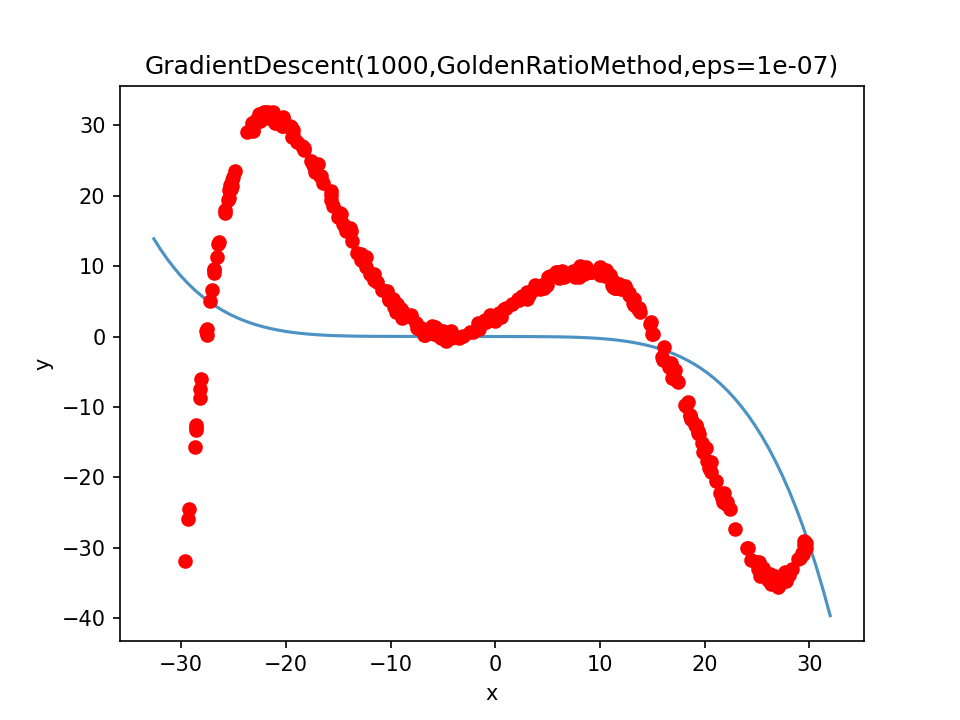

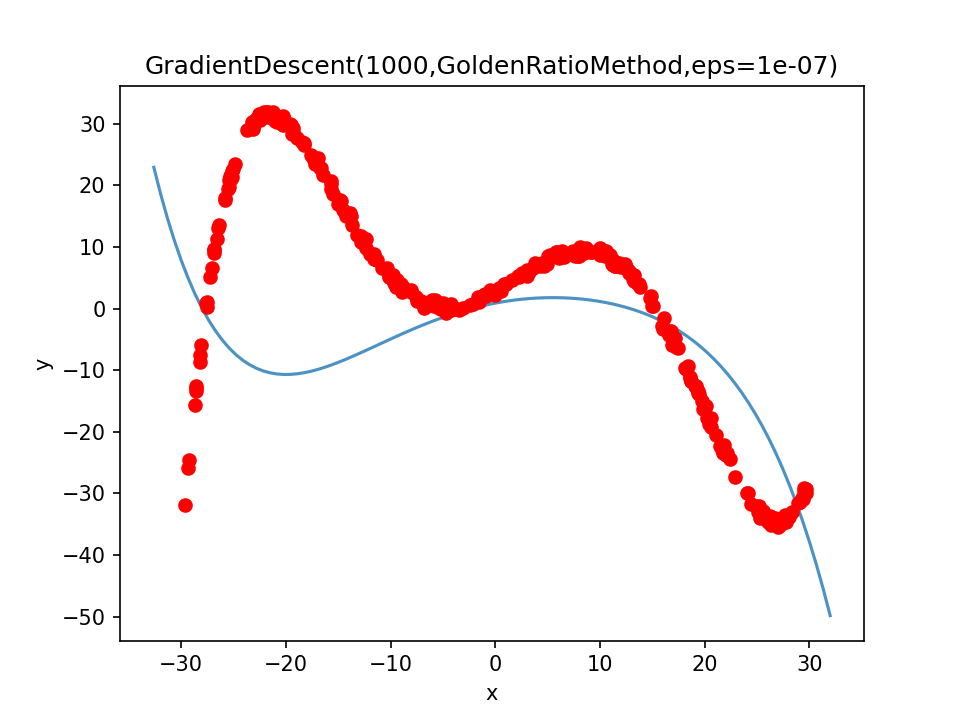

In [37]:
seed()
result = Runner.run(methods,oraculs,point, modules, precision=defPrec, **TABLE, **VISUALIZE, **VISUALIZE_FUNCTION)

In [38]:
def waveSum(a: float,b: float, point: np.ndarray) -> np.ndarray:
    x = point[0]
    wave1 = sin(a * x)
    wave2 = sin(b * x)
    return np.array([x, wave1 + wave2])

In [39]:
coefficients = [3, 1]
wave = partial(waveSum, *coefficients)
noise = 0.1
range_ = 5

data = noised_data_generator(wave, point_count, -range_, range_, noise)

methods = [GradientDescent(learning_rate=pi, aprox_dec=1e-7)]
oraculs = [    
    MinimisingOracul(MSE(), LambdaInterpretation(func = polynomSum, eval_dim = 2), data, point_count // 10),
    MinimisingOracul(MSE(), LambdaInterpretation(func = polynomSum, eval_dim = 2), data, point_count // 1),
    
    MinimisingOracul(L1(MSE(), 0.005), LambdaInterpretation(func = polynomSum, eval_dim = 2), data, point_count // 10),
    MinimisingOracul(L2(MSE(), 0.001), LambdaInterpretation(func = polynomSum, eval_dim = 2), data, point_count // 10),
    MinimisingOracul(Elastic(MSE(), 0.003, 0.0005), LambdaInterpretation(func = polynomSum, eval_dim = 2), data, point_count // 10),
]

point = np.array([0, -30, 80, -40, -2, -6])

SEED: 1718011711289140000



MinimisingOracul
+----------------------------------------------------------------+-----------------+-----------+--------------+-------------+---------------------+-------------+-------------------------------------------------------------------+
| Method name                                                    |   ExecutionTime | RAMSize   |   EpochCount |   CallCount |   GradientCallCount |   LossValue | Result                                                            |
+================================================================+=================+===========+==============+=============+=====================+=============+===================================================================+
| GradientDescent(3.141592653589793,GoldenRatioMethod,eps=1e-07) |         18.8418 | 0.0 Mb    |           30 |       11400 |                 300 |     7.80285 | [ -0.19556864   4.89381705   6.01613329 -31.98263208 -17.80041231 |
|                                                             

/Users/mike/Documents/Methods-of-optimization/venv/lib/python3.9/site-packages/matplotlib/animation.py:892: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


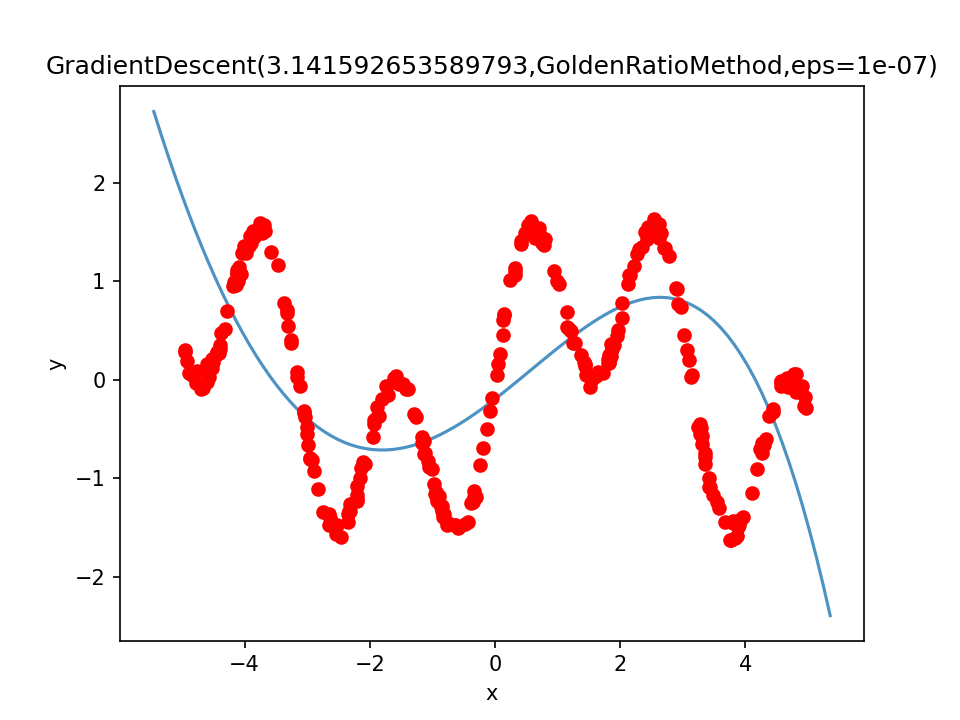

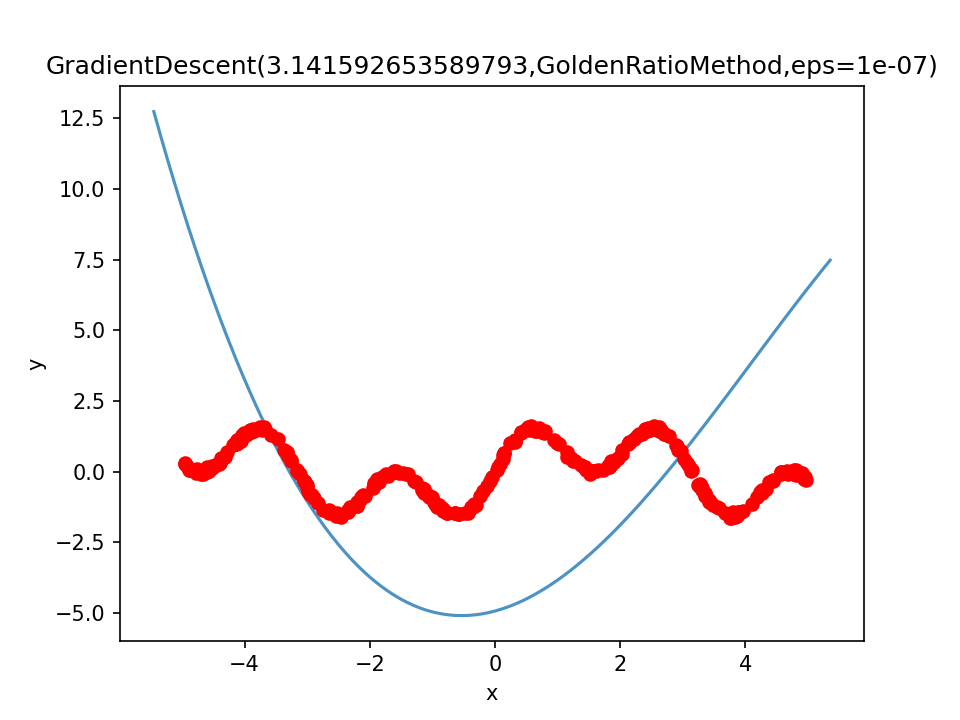

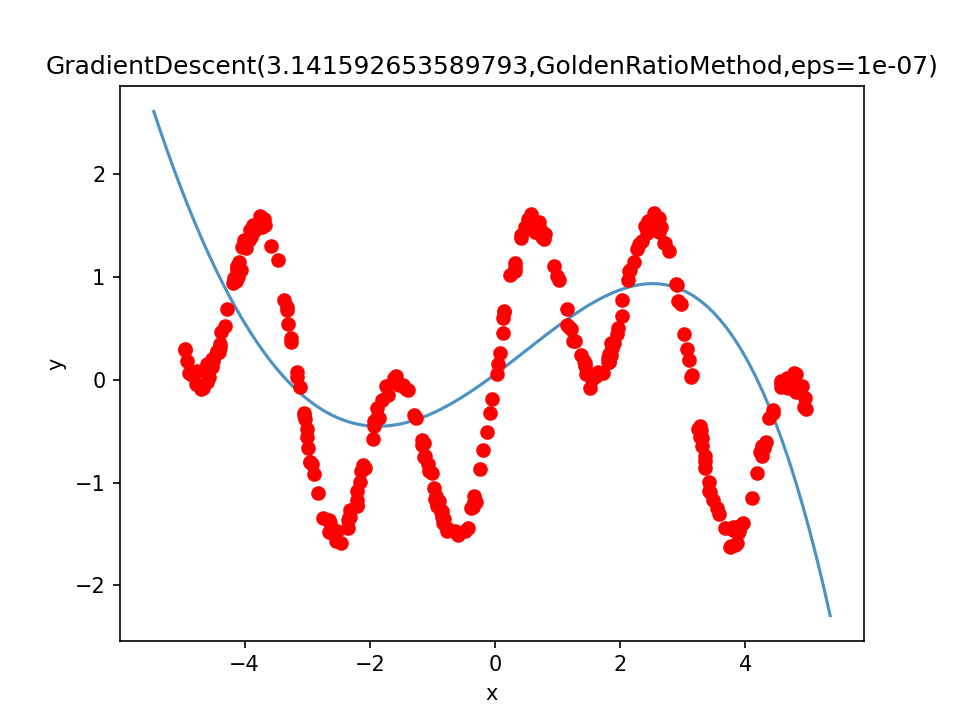

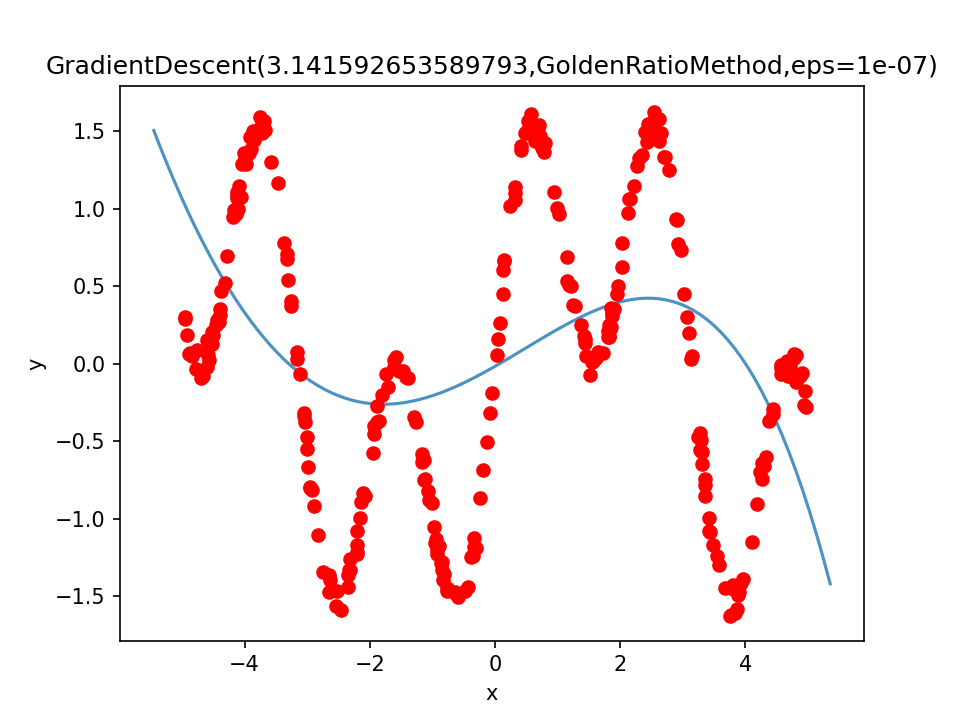

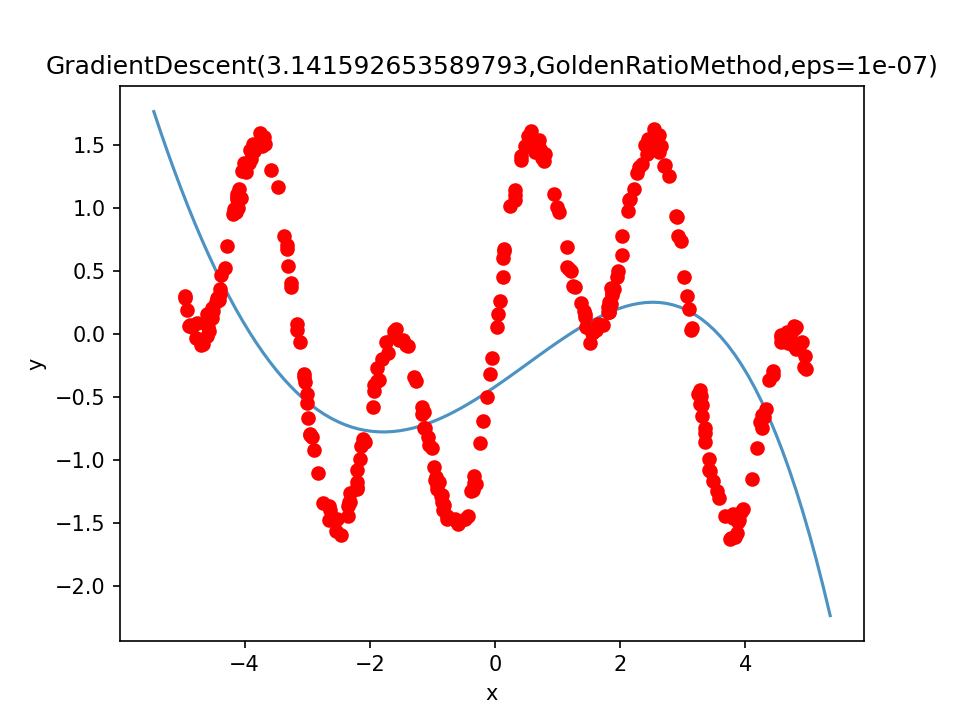

In [40]:
seed()
result = Runner.run(methods,oraculs,point, modules, precision=defPrec, **TABLE, **VISUALIZE, **VISUALIZE_FUNCTION)

In [41]:
methods = [GradientDescent(learning_rate=3, aprox_dec=1e-7)]
oraculs = [
    MinimisingOracul(MSE(), LambdaInterpretation(func = waveSum, eval_dim = 2), data, point_count // 10),
    MinimisingOracul(MSE(), LambdaInterpretation(func = waveSum, eval_dim = 2), data, 1),

    MinimisingOracul(L1(MSE(), 0.2), LambdaInterpretation(func = waveSum, eval_dim = 2), data, point_count // 10),
    MinimisingOracul(L2(MSE(), 0.07), LambdaInterpretation(func = waveSum, eval_dim = 2), data, point_count // 10),
    MinimisingOracul(Elastic(MSE(), 0.15, 0.05), LambdaInterpretation(func = waveSum, eval_dim = 2), data, point_count // 10),
]

point = np.array([-1, 0])

SEED: 1718011819482454000



MinimisingOracul
+------------------------------------------------+-----------------+-----------+--------------+-------------+---------------------+-------------+-----------------------------+
| Method name                                    |   ExecutionTime | RAMSize   |   EpochCount |   CallCount |   GradientCallCount |   LossValue | Result                      |
+================================================+=================+===========+==============+=============+=====================+=============+=============================+
| GradientDescent(3,GoldenRatioMethod,eps=1e-07) |          8.6689 | 0.0 Mb    |           30 |       11400 |                 300 |     1.88159 | [-14.74413213  24.05989688] |
+------------------------------------------------+-----------------+-----------+--------------+-------------+---------------------+-------------+-----------------------------+

MinimisingOracul
+------------------------------------------------+-----------------+-------------+--

/Users/mike/Documents/Methods-of-optimization/venv/lib/python3.9/site-packages/matplotlib/animation.py:892: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


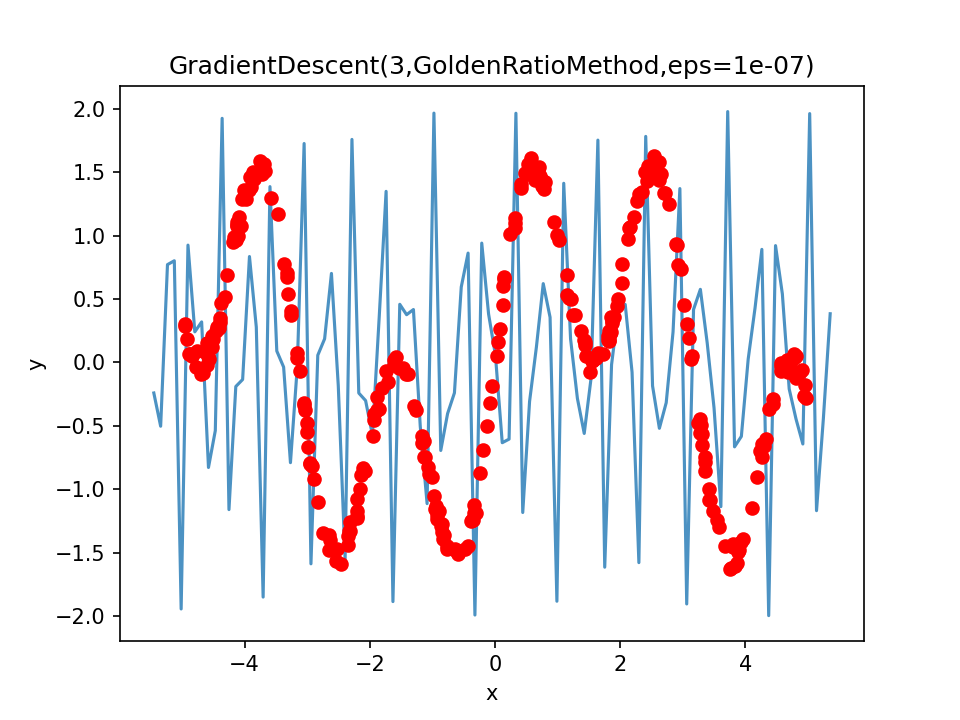

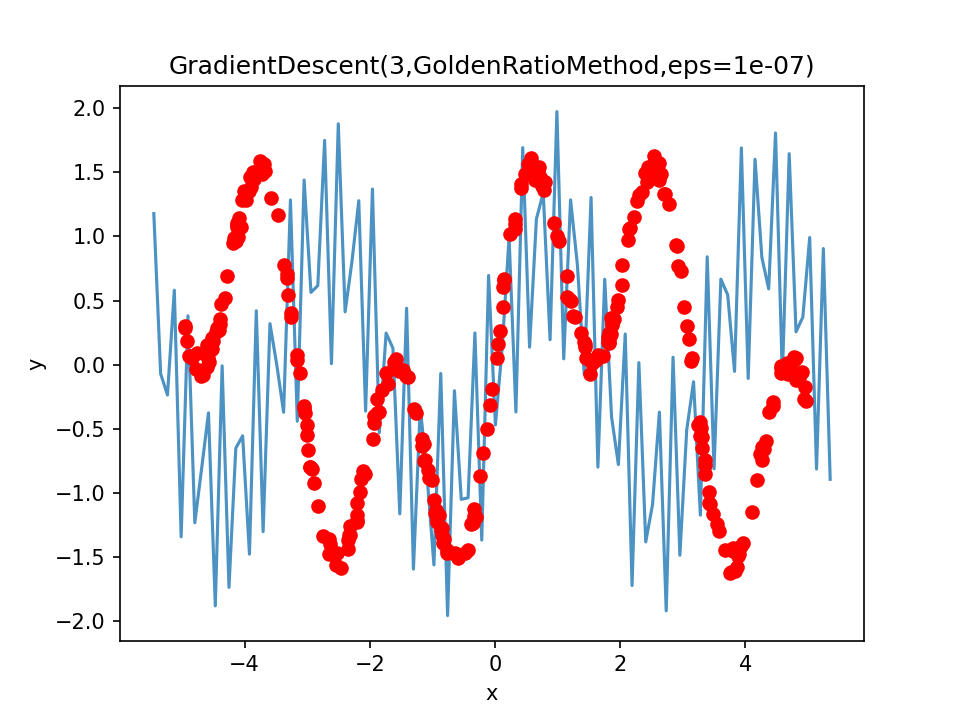

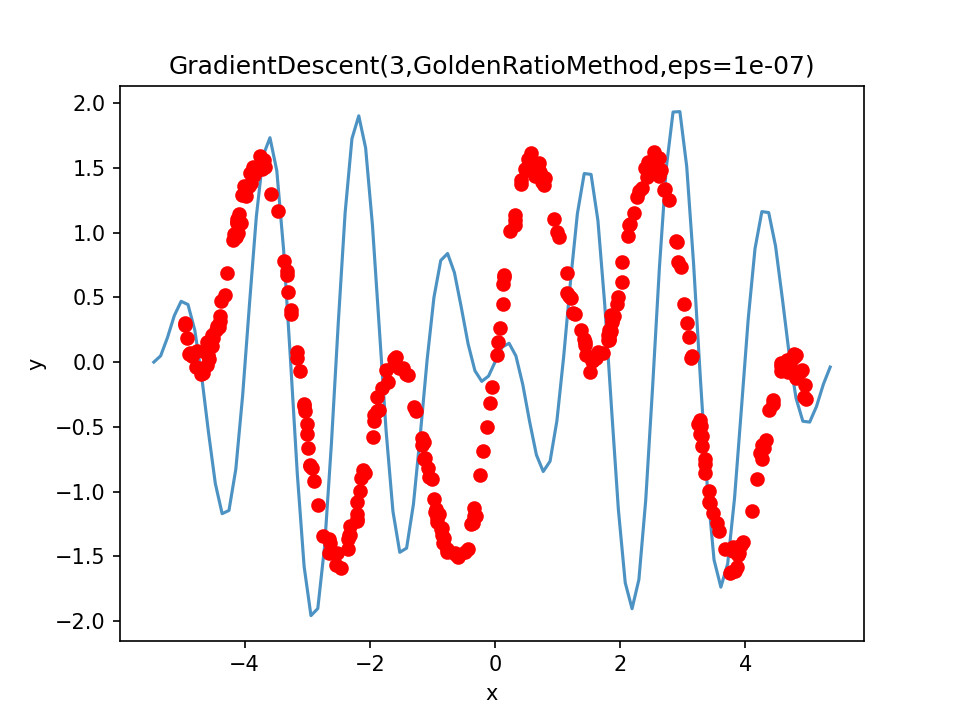

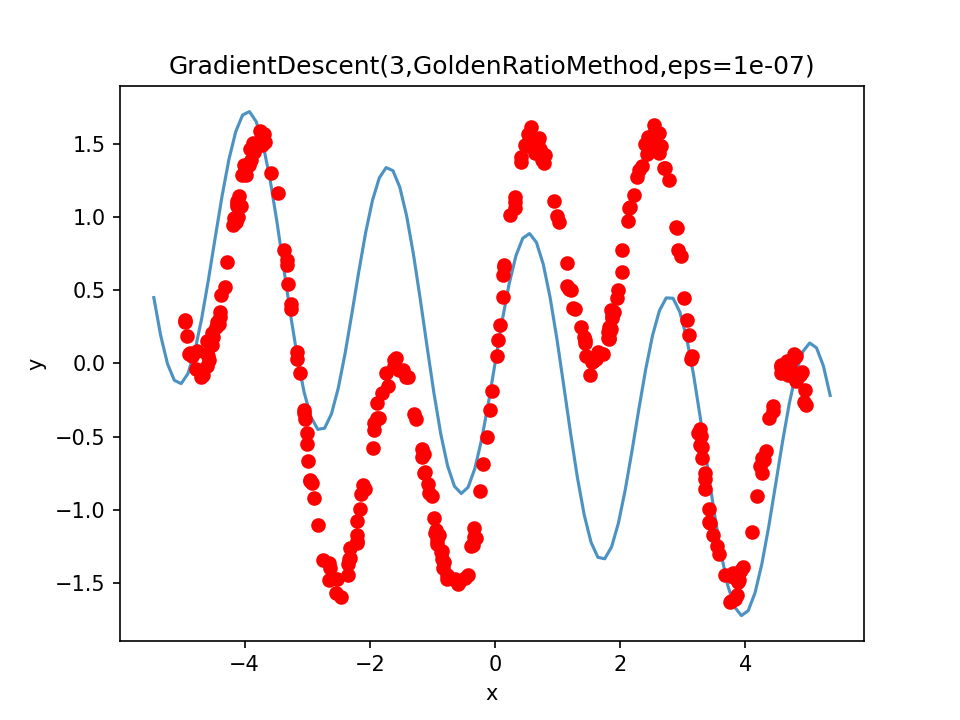

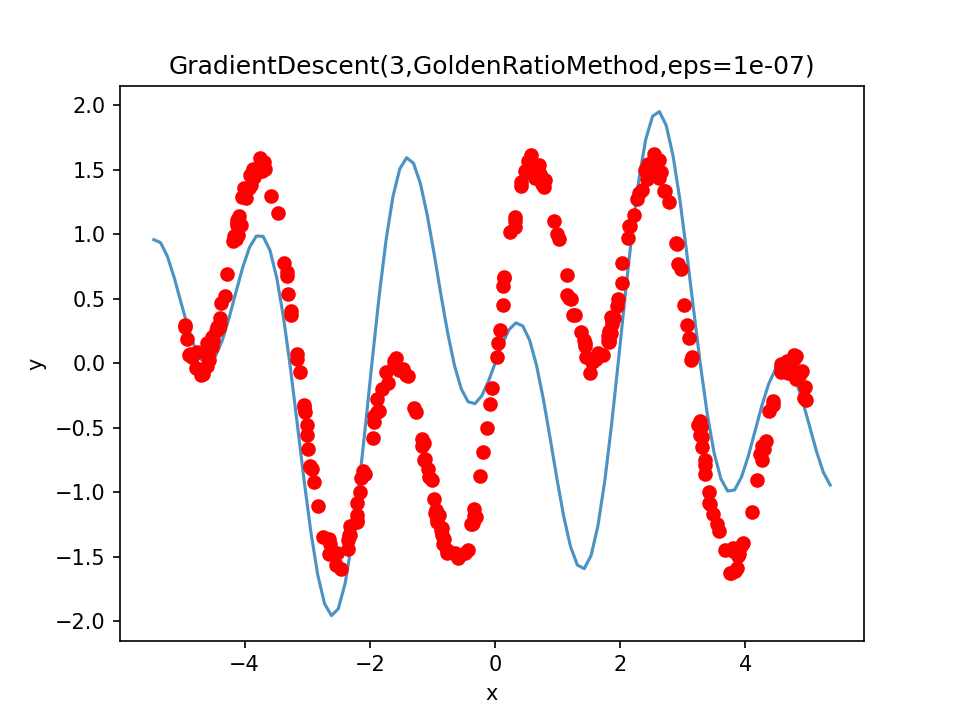

In [42]:
seed()
result = Runner.run(methods,oraculs,point, modules, precision=defPrec, **TABLE, **VISUALIZE, **VISUALIZE_FUNCTION)

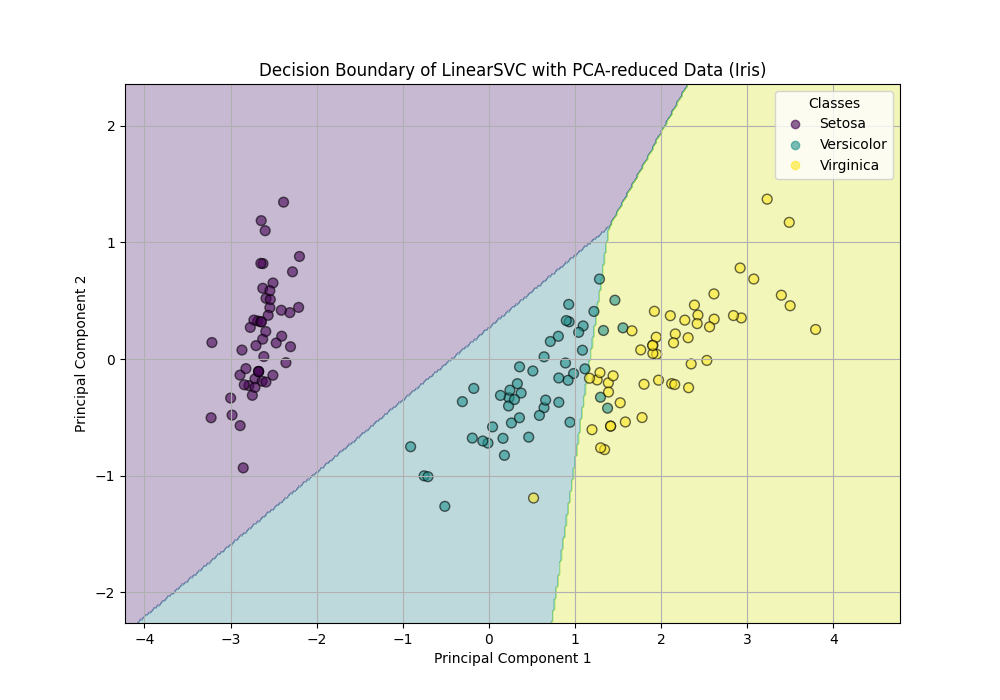

In [43]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.datasets import make_classification
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import LinearSVC
from sklearn.decomposition import PCA

pyplot.rcParams['figure.dpi'] = 100
pyplot.rcParams['savefig.dpi'] = 100

with open('iris.data', 'r') as f:
    data = [list(map(lambda x: float(x) if ord('0') <= ord(x[0]) <= ord('9') else x.replace('\n', ''),
                     line.split(','))) for line in f]


X = [st[0:4] for st in data]
y = [st[4] for st in data]
index = 0
classes = dict()
for i in range(len(y)):
    if y[i] not in classes:
        classes[y[i]] = index
        index += 1
    y[i] = classes[y[i]]

clf = make_pipeline(StandardScaler(), LinearSVC(random_state=0, tol=1e-5))
clf.fit(X, y)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

x_min, x_max = X_pca[:, 0].min() - 1, X_pca[:, 0].max() + 1
y_min, y_max = X_pca[:, 1].min() - 1, X_pca[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.02),
                     np.arange(y_min, y_max, 0.02))

Z = clf.predict(pca.inverse_transform(np.c_[xx.ravel(), yy.ravel()]))
Z = Z.reshape(xx.shape)

plt.figure(figsize=(10, 7))
plt.contourf(xx, yy, Z, alpha=0.3, cmap='viridis')
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y, cmap='viridis', edgecolor='k', s=50, alpha=0.6)
plt.title('Decision Boundary of LinearSVC with PCA-reduced Data (Iris)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(handles=scatter.legend_elements()[0], labels=['Setosa', 'Versicolor', 'Virginica'], title="Classes")
plt.grid(True)
plt.show()


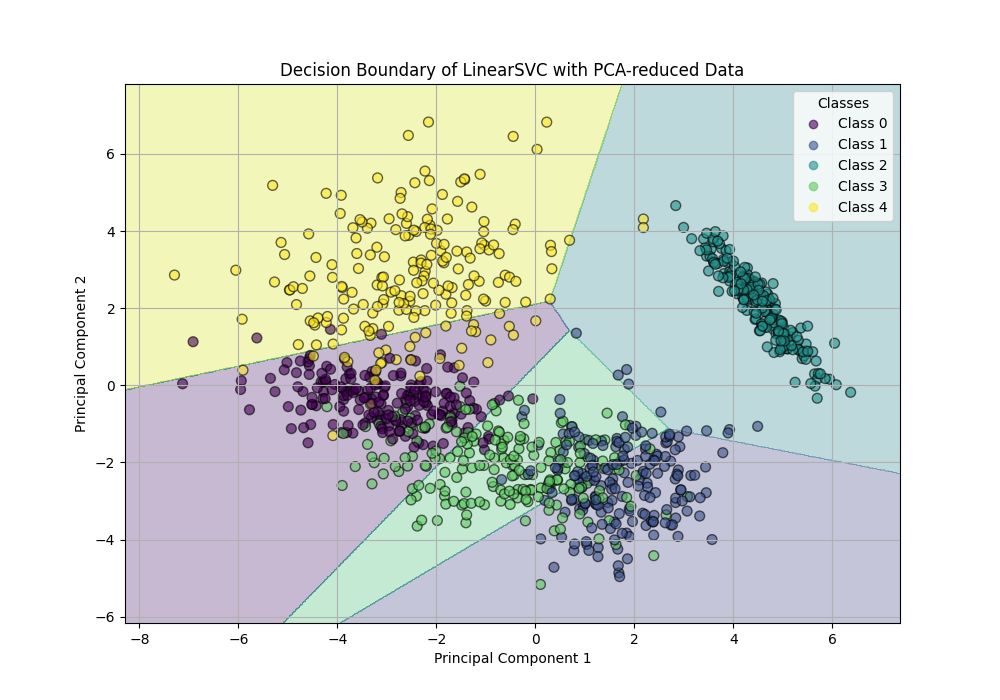

In [44]:
X,y = make_classification(n_samples=1000, n_features=16, n_informative=4,n_redundant=0, n_repeated=0, n_classes=5, n_clusters_per_class=1,class_sep=2,flip_y=0,weights=[0.2,0.2,0.2,0.2, 0.2], random_state=17)

clf = make_pipeline(StandardScaler(), LinearSVC(random_state=0, tol=1e-5))
clf.fit(X, y)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

x_min, x_max = X_pca[:, 0].min() - 1, X_pca[:, 0].max() + 1
y_min, y_max = X_pca[:, 1].min() - 1, X_pca[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.02),
                     np.arange(y_min, y_max, 0.02))

Z = clf.predict(pca.inverse_transform(np.c_[xx.ravel(), yy.ravel()]))
Z = Z.reshape(xx.shape)

plt.figure(figsize=(10, 7))
plt.contourf(xx, yy, Z, alpha=0.3, cmap='viridis')
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y, cmap='viridis', edgecolor='k', s=50, alpha=0.6)
plt.title('Decision Boundary of LinearSVC with PCA-reduced Data')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(handles=scatter.legend_elements()[0], labels=['Class 0', 'Class 1', 'Class 2', 'Class 3', 'Class 4', 'Class 5', 'Class 6'],
           title="Classes")
plt.grid(True)
plt.show()